# Sommer et al. 2026

Code used to 

I) analyze data, 

II) simulate, 

III) plot results, 

of A) Padamsey et al. 2022 [1] data and B) Zeldenrust et al. 2024 [2] data.




[1] Padamsey, Z., Katsanevaki, D., Dupuy, N. & Rochefort, N. L. Neocortex saves energy by reducing coding precision during food scarcity. Neuron 110, 280-296.e10 (2022).
  
[2] Zeldenrust, F., Calcini, N., Yan, X., Bijlsma, A. & Celikel, T. The tuning of tuning: How adaptation influences single cell information transfer. PLOS Comput. Biol. 20, e1012043 (2024).

In [64]:

import Functions.data_analysis_Zeldenrust_functions as dafZ
import Functions.analysis_functions as af
import Functions.synaptic_input_functions as sif
import Functions.simulation_functions as sf
import Functions.plotting_functions as pf
import Functions.paper_energy_information_trade_off_plotting_functions as ppf

import pickle as pickle
import numpy as np
import matplotlib.pyplot as plt

color_CTR = 'black'
color_FR = 'red'
color_CTR_like='#4a61e8'
color_FR_like='#c41c5f'
color_FR_non_mult_scale = 'darkred'
color_V_rest_var = 'darkcyan'
color_V_thresh_var = 'darkviolet'
color_exc = 'coral'
color_inh = 'cornflowerblue'


color_w_e='#2e7d32'
color_r_e='#8B0000'
color_input_exc=color_r_e
color_input_inh='lightskyblue'

colors_ad = [tuple(c) for c in plt.cm.Blues(np.linspace(0.25, 0.85, 5))]  # bright -> dark
color_AP_no_ad='darkgrey'
color_AP_ad='mediumblue'
color_K = "#556B2F"
color_Na = "#D2691E"
color_Ca = "#2A9DF4"
color_h = "#3C9A87"


color_bar_information_per_energy = 'viridis'

panelletterfontsize = ppf.set_paper_style()
fontsizes={'panelletterfontsize': panelletterfontsize}

In [65]:

import importlib 
importlib.reload(pf)
importlib.reload(ppf)


<module 'Functions.paper_energy_information_trade_off_plotting_functions' from '/Users/psommer/Desktop/Energy-function-trade-off/Code/Functions/paper_energy_information_trade_off_plotting_functions.py'>

## Fig. 1

In [ ]:
# generate Fig. 1 data

# generate simulated data
grid_points = 11

R_m_values = np.linspace(50, 200, grid_points) # MOhm 
E_L_values = np.linspace(-90, -60, grid_points) # mV
w_scale_values = np.linspace(15, 240, grid_points) 
parameter_ranges = (R_m_values, E_L_values, w_scale_values)

model_mode = ['LIF', 'AdExp']
membrane_noise=1.0

results_AdExp = sf.multiple_grid_runs(number_grid_runs, parameter_ranges, model_mode, membrane_noise, starting_number=1, savename='Padamsey_grid')
# see python script: 3D_grid_run_cluster.py --> ready to store here

folder_path='../Data/Padamsey_grid'
results_mean =  af.load_and_process_multiple_results(savedname='Padamsey_grid',  model_mode=model_mode, folder_path=folder_path, results_mode='mean', spike_times_mode=False)

results_mean_spiking_trials = af.weight_results_by_spiking_trials(results_mean, results_number_data_points)


In [6]:
# loading Fig. 1 data
with open('../Data/Padamsey_grid/updated_final_Padamsey_grid_small.pkl', 'rb') as f: 
    results_mean_spiking_trials = pickle.load(f) 


# analyze experimental data
# experimental means of CTR & FR 
R_m_CTR = 93.0 
E_L_CTR = -72.0
tuning_curve_target_CTR = np.array([0.42, 0.52, 0.87, 1.43, 0.64, 0.42, 0.42])

R_m_FR = 113.0
E_L_FR = -66.0
tuning_curve_target_FR = np.array([0.71, 0.83,  1.05,  1.77, 0.96, 0.81, 0.71])

# compute closest tuning curves
closest_key_CTR, closest_curve_CTR, closest_coords_CTR = closest_key, closest_curve, closest_coords = pf.find_best_fitting_tuning_curve(results_mean_spiking_trials, R_m_CTR, E_L_CTR, tuning_curve_target_CTR)
closest_key_FR, closest_curve_FR, closest_coords_FR = pf.find_best_fitting_tuning_curve(results_mean_spiking_trials, R_m_FR, E_L_FR, tuning_curve_target_FR)

# define CTR & FR coordinates
CTR_FR = (closest_coords_CTR, closest_coords_FR)

# load experimental data points
exp_data_raw = sf.load_experimental_data()
exp_data_CTR_raw = exp_data_raw[0]
exp_data_FR_raw = exp_data_raw[1]

# fit experimental w_scale_0 data to grid

# define target values by CTR & FR fitted tuning curves
target_CTR = closest_coords_CTR
target_FR = closest_coords_FR #_test

# predict scaling factors for CTR & FR 
w_scale_factor_CTR = pf.predict_scaled_w_scale(exp_data_CTR_raw, target_CTR)
w_scale_factor_FR = pf.predict_scaled_w_scale(exp_data_FR_raw, target_FR)
w_scale_factor = (w_scale_factor_CTR + w_scale_factor_FR)/2 # mean over CTR & FR

print('w_scale_factor: ' + str(w_scale_factor))

#w_scale_factor = 5500 for V_thresh version
# scale w_scale_0 data 
exp_data_CTR = (exp_data_CTR_raw[0], exp_data_CTR_raw[1], exp_data_CTR_raw[2] * w_scale_factor)
exp_data_FR = (exp_data_FR_raw[0], exp_data_FR_raw[1], exp_data_FR_raw[2] * w_scale_factor)
exp_data = (exp_data_CTR, exp_data_FR)

# find corresponding grid points to experimental data points

results_grid_point_to_exp_data_CTR = pf.find_closest_grid_points_to_exp_data(results_mean_spiking_trials, exp_data_CTR)
results_grid_point_to_exp_data_FR = pf.find_closest_grid_points_to_exp_data(results_mean_spiking_trials, exp_data_FR)
results_grid_point_to_exp_data = (results_grid_point_to_exp_data_CTR, results_grid_point_to_exp_data_FR)

R_m, E_L, w_scale, I_syn_e, r_post, E_tot, CV_V_m, OSI, OSI_per_energy, MI_tuning_curve, MI_tuning_curve_per_energy, MICE_tuning_curve, MICE_tuning_curve_per_energy, MI_post, MI_post_per_energy, MICE_post, MICE_post_per_energy, CV_ISI, CV_ISI_per_energy, MI, MI_per_energy, TE, TE_per_energy, MICE, MICE_per_energy, TECE, TECE_per_energy, MI_new, MI_new_per_energy, MICE_new, MICE_new_per_energy, TE_new, TE_new_per_energy, TECE_new, TECE_new_per_energy = pf.load_data_correlations(results_mean_spiking_trials)


w_scale_factor: 4809.365617876234


1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp
Zapf NOT subset; don't know how to subset; dropped
feat NOT subset; don't know how to subset; dropped
morx NOT subset; don't know how to subset; dropped


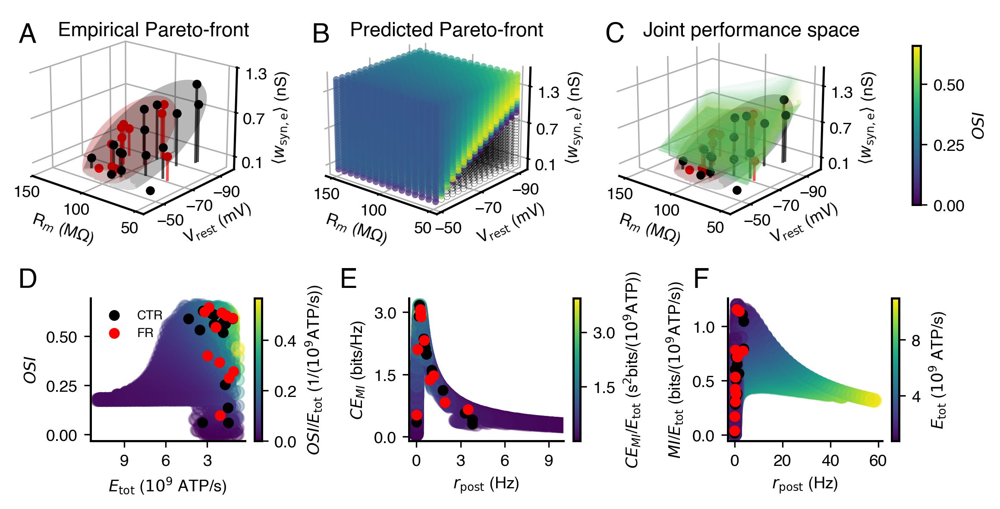

In [31]:
# plotting Fig. 1 data

#figA=pf.plot_interactive_3D(results_mean_spiking_trials, value_key='OSI', title=None, lower_threshold=0.65, interpolation=True, exp_data=exp_data, plot_ellipsoids=True, colorbar_mode=False, axes_mode=True, base_font_size=50, eye=dict(x=-1.7, y=1.7, z=0.5));
#figB=pf.plot_interactive_3D(results_mean_spiking_trials, value_key='OSI', title=None, lower_threshold=0.43, interpolation=True, colorbar_mode=False, axes_mode=True, base_font_size=50, eye=dict(x=-1.7, y=1.7, z=0.5));
#figC=pf.plot_interactive_3D(results_mean_spiking_trials, value_key='OSI', title=None, lower_threshold=0.43, interpolation=True, exp_data=exp_data, plot_ellipsoids=True, axes_mode=True, base_font_size=50, eye=dict(x=-1.8, y=1.8, z=0.5));
#ppf.fig_Pareto_optimality_Padamsey(figA, figB, figC, results_mean_spiking_trials, results_grid_point_to_exp_data=results_grid_point_to_exp_data, colors=[color_CTR, color_FR, plt.cm.viridis(1.0)], fontsizes=fontsizes, figsize=(9,4.5), savename_mode=True)

ppf.fig_Pareto_optimality_Padamsey(results_mean_spiking_trials, exp_data=exp_data, results_grid_point_to_exp_data=results_grid_point_to_exp_data, colors=[color_CTR, color_FR, plt.cm.viridis(1.0)], fontsizes=fontsizes, figsize=(9,4.5), savename_mode=True)


In [101]:
# create Fig. 1 videos

eye=dict(x=-1.81, y=2.16, z=1.03)
duration=2
fps=5
base_font_size=37

# create Fig. 1A videos
vid_fig_1A = pf.plot_interactive_3D(results=results_mean_spiking_trials, value_key='OSI', title=None, cmin=None, cmax=None, lower_threshold=0.45, upper_threshold=None, interpolation=True, all_trajectories=None, CTR_FR=None, exp_data=exp_data, plot_ellipsoids=True, plot_exp_stems=True, colorbar_mode=False, legend_mode=False, axes_mode=False, base_font_size=base_font_size, eye=eye, show_mode=False)
vid_fig_1A.update_traces(opacity=0, selector=dict(type='volume'))
pf.create_rotation_video(vid_fig_1A, "vid_fig_1A_rotating", duration=duration, fps=fps, eye=eye)

# create Fig. 1B videos
vid_fig_1B = pf.plot_interactive_3D(results=results_mean_spiking_trials, value_key='OSI', title=None, cmin=None, cmax=None, lower_threshold=None, upper_threshold=None, interpolation=False, all_trajectories=None, CTR_FR=None, exp_data=None, plot_ellipsoids=False, plot_exp_stems=True, colorbar_mode=True, legend_mode=False, axes_mode=False, base_font_size=base_font_size, eye=eye, show_mode=False)
pf.create_rotation_video(vid_fig_1B, "vid_fig_1B_rotating", duration=duration, fps=fps, eye=eye)

# create Fig. 1C videos
vid_fig_1C = pf.plot_interactive_3D(results=results_mean_spiking_trials, value_key='OSI', title=None, cmin=None, cmax=None, lower_threshold=0.45, upper_threshold=None, interpolation=True, all_trajectories=None, CTR_FR=None, exp_data=exp_data, plot_ellipsoids=True, plot_exp_stems=True, colorbar_mode=True, legend_mode=False, axes_mode=False, base_font_size=base_font_size, eye=eye, show_mode=False)
pf.create_rotation_video(vid_fig_1C, "vid_fig_1C_rotating", duration=duration, fps=fps, eye=eye)


Video saved at ../Figures/vid_fig_1A_rotating.gif


In [58]:
# Pareto-ranking analysis
importlib.reload(af)
pareto_analysis_Padamsey = af.calculate_padamsey_pareto_manifold_analysis(results_mean_spiking_trials, results_grid_point_to_exp_data_CTR, results_grid_point_to_exp_data_FR, information_key="OSI", energy_key="E_tot", near_pareto_fractions=(0.025, 0.05, 0.10, 0.15), primary_fraction=0.10, grid_fractions=(0.25, 0.5, 0.75, 1.0), n_neighbors=5, max_neighbor_fraction=0.7, n_permutations=5000, random_seed=0, print_mode=True)



PADAMSEY | standardized R_m, V_rest, w_scale parameter space
PARETO-RANK DISTRIBUTION
Number of simulations: 8192
Number of Pareto fronts: 1652
Strict Pareto-front fraction: 0.0023193359375
Normalized rank-density slope: -4.2362745410448515

EXPERIMENTAL PARETO POSITION
CTR median Pareto fraction: 0.063232421875 IQR: [0.04193115 0.07745361]
FR median Pareto fraction: 0.0318603515625 IQR: [0.01202393 0.09075928]
FR - CTR median Pareto fraction: -0.0313720703125 | p: 0.15476904619076184

STRICT PARETO CORE | rank = 0
Points: 19 | fraction: 0.0023193359375
Global D_eff: 1.7598928936462572 | p: 0.0001999600079984003 | M2: 0.9984172781219526 | p(M2): 0.0001999600079984003
Local D_eff: 1.4233511771143292 IQR: [1.26071773 1.82195133] | p: 0.0001999600079984003 | M2: 0.9999787351882025 | p(M2): 0.0001999600079984003
Distance -> worse Pareto fraction: rho = 0.49221141844559513 | p = 0.0001999600079984003
CTR distance ratio: 0.3484030872736935 | p: 0.0001999600079984003
FR distance ratio: 0.468

## Fig. 2

In [ ]:
# generate Fig. 2 data

# python script: Zeldenrust_data_analysis_full
data_exp_folder = "../Data"
data_SBI_folder = "../Data_analyzed_PS/sequential_large"
df_updated = dafZ.compute_emd_for_all_files_and_update_csv(data_exp_folder, data_SBI_folder)

results_analysis_exc = dafZ.extract_results_by_mode("../Data_analyzed_PS/sequential_large", mode='excitatory', sequential_SBI_name=sequential_SBI_name, sequential_SBI_quality_final=sequential_SBI_quality_final)
results_analysis_inh = dafZ.extract_results_by_mode("../Data_analyzed_PS/sequential_large", mode='inhibitory', sequential_SBI_name=sequential_SBI_name, sequential_SBI_quality_final=sequential_SBI_quality_final)

# generate Fig. 6A data
# load experimental data analysis results
with open('../../Zeldenrust_data_analysis/Zeldenrust_results_analysis_exc.pkl', 'rb') as f: 
    results_analysis_exc = pickle.load(f)

clip_dict = {
    "E_L_mV_list":            (-90.0, -40.0),
    "R_m_mean_MOhm_list":     (10.0, 500.0),
    "C_m_mean_pF_list":       (5.0, 120.0),
    "V_thresh_mV_list":       (-60.0, -25.0),
    "Delta_T_mean_mV_list":   (0.1, 5.0),
    "V_reset_mean_mV_list":   (-90.0, -25.0),
    "tau_w_mean_ms_list":     (5.0, 700.0),
    "a_w_mean_nS_list":       (0.5, 10.0),
    "b_w_mean_nA_list":       (0.001, 0.15)}

features_list = ['E_L_mV_list', 'V_thresh_mV_list', 'R_m_mean_MOhm_list', 'C_m_mean_pF_list', 'Delta_T_mean_mV_list', 'V_reset_mean_mV_list', 'tau_w_mean_ms_list', 'a_w_mean_nS_list', 'b_w_mean_nA_list']
empty_dic = {'name_list': [],  'E_L_mV_list': [], 'V_thresh_mV_list': [], 'R_m_mean_MOhm_list': [], 'C_m_mean_pF_list': [], 'Delta_T_mean_mV_list': [], 'V_reset_mean_mV_list': [], 'tau_w_mean_ms_list': [], 'a_w_mean_nS_list': [], 'b_w_mean_nA_list': []}
pca_exc, scores_exc, cell_types_list_exc, X_full_scaled_exc, scaler_exc = dafZ.run_pca_analyzed_data_Zeldenrust(results_analysis_exc, empty_dic, features_list, n_components=3)

results_analysis_PCA_analyzed_exc = dafZ.build_dic_exp_data(results_analysis_exc, pca_exc, scores_exc, X_full_scaled_exc, scaler_exc)

scores=scores_exc
std_PCA=3
grid_points=11
neuron_type_mode='excitatory'
pca=pca_exc
features_list=features_list
scaler=scaler_exc
membrane_noise=1.0
w_scale=200
number_grid_runs=100
savename='PCA_grid_3std_clipped'
sf.Zeldenrust_multiple_grid_runs_PCA(number_grid_runs, scores, std_PCA, grid_points, neuron_type_mode, pca, features_list, scaler, membrane_noise, w_scale, clip_dict=clip_dict, savename=savename)


# generate Fig. 6B data
# load experimental data analysis results
with open('../../Zeldenrust_data_analysis/Zeldenrust_results_analysis_inh.pkl', 'rb') as f: 
    results_analysis_inh = pickle.load(f)

clip_dict = {
    "E_L_mV_list":            (-90.0, -40.0),
    "R_m_mean_MOhm_list":     (10.0, 500.0),
    "C_m_mean_pF_list":       (5.0, 120.0),
    "V_thresh_mV_list":       (-60.0, -25.0),
    "Delta_T_mean_mV_list":   (0.1, 5.0),
    "V_reset_mean_mV_list":   (-90.0, -25.0),
    "tau_w_mean_ms_list":     (5.0, 700.0),
    "a_w_mean_nS_list":       (0.5, 10.0),
    "b_w_mean_nA_list":       (0.001, 0.15)}

features_list = ['E_L_mV_list', 'V_thresh_mV_list', 'R_m_mean_MOhm_list', 'C_m_mean_pF_list', 'Delta_T_mean_mV_list', 'V_reset_mean_mV_list', 'tau_w_mean_ms_list', 'a_w_mean_nS_list', 'b_w_mean_nA_list']
empty_dic = {'name_list': [],  'E_L_mV_list': [], 'V_thresh_mV_list': [], 'R_m_mean_MOhm_list': [], 'C_m_mean_pF_list': [], 'Delta_T_mean_mV_list': [], 'V_reset_mean_mV_list': [], 'tau_w_mean_ms_list': [], 'a_w_mean_nS_list': [], 'b_w_mean_nA_list': []}
pca_inh, scores_inh, cell_types_list_inh, X_full_scaled_inh, scaler_inh = dafZ.run_pca_analyzed_data_Zeldenrust(empty_dic, results_analysis_inh, features_list, n_components=3)

results_analysis_PCA_analyzed_inh = dafZ.build_dic_exp_data(results_analysis_inh, pca_inh, scores_inh, X_full_scaled_inh, scaler_inh)

scores=scores_inh
std_PCA=3
grid_points=11
neuron_type_mode='inhibitory'
pca=pca_inh
features_list=features_list
scaler=scaler_inh
membrane_noise=1.0
w_scale=100
number_grid_runs=100
savename='PCA_grid_3std_clipped'
sf.Zeldenrust_multiple_grid_runs_PCA(number_grid_runs, scores, std_PCA, grid_points, neuron_type_mode, pca, features_list, scaler, membrane_noise, w_scale, clip_dict=clip_dict, savename=savename)

folder_path = os.path.dirname(os.path.abspath(__file__))
savedname='Zeldenrust_PCA_grid_3std_clipped'
model_mode = 'inhibitory'
spike_times_mode = False

for results_mode in ['mean', 'std', 'error', 'normalized_error', 'number_data_points']:
    result =  af.load_and_process_multiple_results(savedname=savedname,  model_mode=model_mode, folder_path=folder_path, results_mode=results_mode, spike_times_mode=spike_times_mode)
    output_file = os.path.join(folder_path, f'3std_{model_mode}_{results_mode}.pkl')
    with open(output_file, 'wb') as f:
        pickle.dump(result, f)

# generate Fig. 6F-G data
with open("../Data/Zeldenrust_FR/Zeldenrust_inh_cell_FR_data.pkl", "rb") as f:
    Zeldenrust_inh_cell_FR_data = pickle.load(f)

max_weight_change_proportion=2.5
Delta_R_m = + 0.22*7 # 25
Delta_E_L = - 0.09*1.8 # 2.5
Delta_I_syn = - 0.35*max_weight_change_proportion # 3.5
n_steps = 10
T = 10 # sec
n_sims=200
membrane_noise=1.5

MI_list, fraction_transferred_information_list, r_post_list, V_m_mean_list, V_m_std_list, spike_times_post_list, MICE_list, MICE_per_energy_list, hit_fraction_list, false_alarm_fraction_list, E_tot_list, R_m_list, E_L_list, I_syn_nA_list = sf.run_Zeldenrust_FR_trajectory(Zeldenrust_inh_cell_FR_data, max_weight_change_proportion, Delta_R_m, Delta_E_L, Delta_I_syn, n_steps, T, n_sims, membrane_noise)
proportion_of_synaptic_change = np.linspace(0, 2.5, n_steps+1)


In [42]:
# loading Fig. 2 data

# loading experiemental results
with open('../Data/Zeldenrust_data_analysis/Zeldenrust_results_analysis_exc.pkl', 'rb') as f: 
    results_analysis_exc = pickle.load(f)
with open('../Data/Zeldenrust_data_analysis/Zeldenrust_results_analysis_inh.pkl', 'rb') as f: 
    results_analysis_inh = pickle.load(f)

features_list = ['E_L_mV_list', 'V_thresh_mV_list', 'R_m_mean_MOhm_list', 'C_m_mean_pF_list', 'Delta_T_mean_mV_list', 'V_reset_mean_mV_list', 'tau_w_mean_ms_list', 'a_w_mean_nS_list', 'b_w_mean_nA_list']
empty_dic = {'name_list': [],  'E_L_mV_list': [], 'V_thresh_mV_list': [], 'R_m_mean_MOhm_list': [], 'C_m_mean_pF_list': [], 'Delta_T_mean_mV_list': [], 'V_reset_mean_mV_list': [], 'tau_w_mean_ms_list': [], 'a_w_mean_nS_list': [], 'b_w_mean_nA_list': []}
pca_exc, scores_exc, cell_types_list_exc, X_full_scaled_exc, scaler_exc = dafZ.run_pca_analyzed_data_Zeldenrust(results_analysis_exc, empty_dic, features_list, n_components=3)
pca_inh, scores_inh, cell_types_list_inh, X_full_scaled_inh, scaler_inh = dafZ.run_pca_analyzed_data_Zeldenrust(empty_dic, results_analysis_inh, features_list, n_components=3)

results_analysis_PCA_analyzed_exc = dafZ.build_dic_exp_data(results_analysis_exc, pca_exc, scores_exc, X_full_scaled_exc, scaler_exc)
results_analysis_PCA_analyzed_inh = dafZ.build_dic_exp_data(results_analysis_inh, pca_inh, scores_inh, X_full_scaled_inh, scaler_inh)
    
# loading simulation results
with open('../Data/Zeldenrust_PC_grid/3std_excitatory_mean.pkl', 'rb') as f: #2 or 10 only_one_sided/
    results_PC_exc = pickle.load(f)

with open('../Data/Zeldenrust_PC_grid/3std_inhibitory_mean.pkl', 'rb') as f: #2 or 10 only_one_sided/
    results_PC_inh = pickle.load(f)
    
# loading Fig. 6F-G data
with open("../Data/Zeldenrust_FR/Zeldenrust_inh_cell_FR_results.pkl", "rb") as f:
    Zeldenrust_inh_cell_FR_results = pickle.load(f)

proportion_of_synaptic_change = Zeldenrust_inh_cell_FR_results['meta']['proportion_of_synaptic_change']
MI_list = Zeldenrust_inh_cell_FR_results['MI_list']
E_tot_list = Zeldenrust_inh_cell_FR_results['E_tot_list']


norm. const. $E_{tot}$ grid exc: 1.5944 $10^{9}$ ATP/s
norm. const. $MI$ grid exc: 0.0288 bits
norm. const. $MI$ per energy grid exc: 0.0297 bits/($10^{9}$ ATP/s)
norm. const. $E_{tot}$ exp exc: 0.8118 $10^{9}$ ATP/s
norm. const. $MI$ exp exc: 0.1675 bits
norm. const. $E_{tot}$ grid inh: 1.5944 $10^{9}$ ATP/s
norm. const. $MI$ grid inh: 0.0288 bits
norm. const. $MI$ per energy grid exc: 0.0085 bits/($10^{9}$ ATP/s)
norm. const. $E_{tot}$ exp inh: 0.6798 $10^{9}$ ATP/s
norm. const. $MI$ grid exc: 0.1951 bits


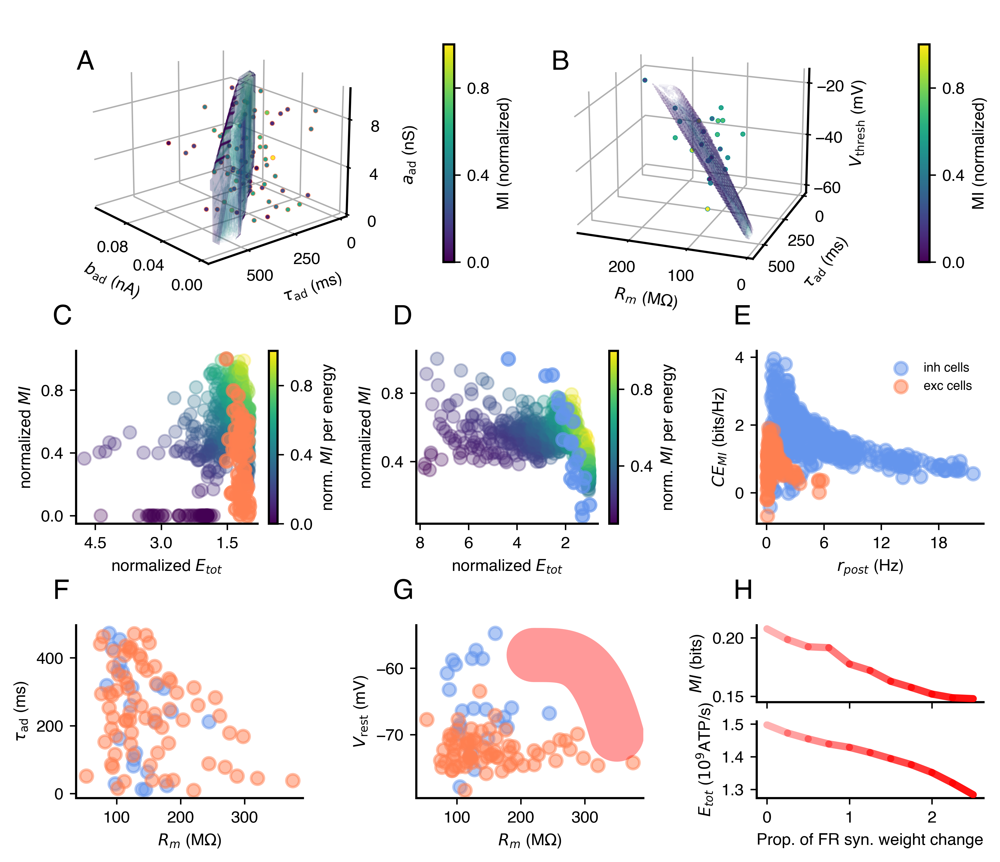

In [16]:
# plotting Fig. 2 data

import importlib 
importlib.reload(pf)
importlib.reload(ppf)


# plane in exc space
value_key = 'MI'
# plane in exc space
#eye=dict(x=1.9, y=-2.1, z=1.2)
#grid_axes=('tau_w_ad','b_ad','a_ad') # 'tau_w_ad'/E_L,'b_ad','a_ad'
#figA = pf.plot_grid_and_exp_interactive_3D(grid_data_exc=results_PC_exc, grid_data_inh=None, exp_data_exc=results_analysis_PCA_analyzed_exc, exp_data_inh=None, value_key=value_key, normalization_mode="normalized_axis", grid_axes=grid_axes, interpolation=True, lower_threshold=0.01, upper_threshold=None, color_exc=color_exc, color_inh=color_inh, grid_marker_size=4, exp_marker_size=6, title=None, axes_mode=True, base_font_size=45, eye=eye, savename=None);

# plane in inh space
#eye=dict(x=-1.6, y=2.2, z=1.2)
#value_key='MI'
#grid_axes=('R_m', 'tau_w_ad', 'V_thresh') # 'tau_w_ad'/E_L,'b_ad','a_ad'
#figB = pf.plot_grid_and_exp_interactive_3D(grid_data_exc=None, grid_data_inh=results_PC_inh, exp_data_exc=None, exp_data_inh=results_analysis_PCA_analyzed_inh, value_key=value_key, normalization_mode="normalized_axis", grid_axes=grid_axes, interpolation=True, lower_threshold=0.005, upper_threshold=None, color_exc=color_exc, color_inh=color_inh, grid_marker_size=4, exp_marker_size=6, title=None, axes_mode=True, base_font_size=45, eye=eye, savename=None);

ppf.fig_Pareto_optimality_Zeldenrust(results_analysis_exc, results_analysis_inh, results_analysis_PCA_analyzed_exc, results_analysis_PCA_analyzed_inh, results_PC_exc, results_PC_inh, proportion_of_synaptic_change, MI_list, E_tot_list, colors=[color_exc, color_inh, color_FR], figsize=(9,8), savename_mode=True)


In [56]:
# Pareto-ranking analysis
importlib.reload(af)
pareto_analysis_Zeldenrust = af.run_zeldenrust_pareto_manifold_analysis(results_analysis_exc, results_analysis_inh, results_analysis_PCA_analyzed_exc, results_analysis_PCA_analyzed_inh, results_PC_exc, results_PC_inh, af.E_tot_eq, near_pareto_fractions=(0.025, 0.05, 0.10, 0.15), primary_fraction=0.10, grid_fractions=(0.25, 0.5, 0.75, 1.0), n_neighbors=5, max_neighbor_fraction=0.7, n_permutations=5000, random_seed=0, max_firing_rate_hz=100.0, include_unfiltered=False, print_results=True)




EXCITATORY | 0 < r_post < 100 Hz
GEOMETRY: standardized PC1-PC3 parameter space
PARETO-RANK DISTRIBUTION
Number of simulations: 618
Number of Pareto fronts: 86
Strict Pareto-front fraction: 0.012944983818770227
Normalized rank-density slope: -3.262587491533076

RELATIVE EXPERIMENTAL PARETO POSITION
EXP median Pareto fraction: 0.3155339805825243 IQR: [0.24271845 0.48058252]
SIM median Pareto fraction: 0.5129449838187702 IQR: [0.27831715 0.75728155]

STRICT PARETO CORE | rank = 0
Points: 8 | fraction: 0.012944983818770227
Global D_eff: 1.8276406373655265 | p: 0.3043391321735653 | M2: 0.9919244544678577 | p(M2): 0.004399120175964807
Local D_eff: 1.2291947013762163 IQR: [1.19859974 1.42785646] | p: 0.012997400519896021 | M2: 1.0 | p(M2): 0.0015996800639872025
Distance -> worse Pareto fraction: rho = 0.1695723323632971 | p = 0.0001999600079984003
EXP distance ratio: 0.9444746037477091 | p: 0.2965406918616277
EXP line/plane alignment: 0.5376613937815421 / 0.6423776720036779 | p: 0.655068986

## Fig. 3

In [29]:
# generate Fig. 3 data

# import model data

# CTR data
w_scales_CTR = [46.42857142857143, 49.48979591836735, 52.55102040816327, 55.61224489795919, 58.6734693877551, 61.73469387755102, 64.79591836734693, 67.85714285714286, 70.91836734693877, 73.9795918367347, 77.0408163265306, 80.10204081632654, 83.16326530612244, 86.22448979591837, 89.28571428571428, 92.3469387755102, 95.40816326530611, 98.46938775510203, 101.53061224489795, 104.59183673469387, 107.65306122448979, 110.71428571428571, 113.77551020408163, 116.83673469387755, 119.89795918367346, 122.95918367346938, 126.0204081632653, 129.0816326530612, 132.14285714285714, 135.20408163265307, 138.26530612244898, 141.32653061224488, 144.3877551020408, 147.44897959183675, 150.51020408163265, 153.57142857142856, 156.6326530612245, 159.6938775510204, 162.75510204081633, 165.81632653061223, 168.87755102040816, 171.93877551020407, 175.0]
r_post_CTR = [0.0, 0.041666666666666664, 0.041666666666666664, 0.08333333333333333, 0.125, 0.20833333333333334, 0.20833333333333334, 0.2916666666666667, 0.5416666666666666, 0.8333333333333334, 0.9166666666666666, 1.2083333333333335, 1.2916666666666667, 1.5833333333333333, 1.75, 2.0416666666666665, 2.5, 2.7916666666666665, 3.1666666666666665, 3.5416666666666665, 3.9166666666666665, 4.333333333333333, 4.75, 5.208333333333333, 5.875, 6.541666666666667, 6.958333333333334, 7.5, 8.125, 8.958333333333334, 9.5, 10.333333333333334, 10.958333333333334, 11.625, 12.291666666666666, 12.916666666666666, 13.75, 14.5, 15.208333333333334, 16.375, 17.0, 17.541666666666668, 18.25]
I_syn_e_CTR = [0.20468990686665456, 0.21716708012996896, 0.2295716877427581, 0.24192811134369965, 0.25423312488949124, 0.26650002497180364, 0.278699523997471, 0.29087948256367735, 0.3030680489861614, 0.3152372783314829, 0.3273190015062498, 0.33942846954324357, 0.3514511422548076, 0.36350823918486813, 0.37550591739271805, 0.3875156358386346, 0.39955257200231953, 0.4115323181656564, 0.42351477904140383, 0.4354734356586195, 0.4474183832312191, 0.45936804268173653, 0.4712989806823503, 0.4832281473851835, 0.4952161219752156, 0.5071903109928454, 0.5190841696483622, 0.5310022341888898, 0.5429309111751601, 0.5549292752560945, 0.56682045052791, 0.5787961027423827, 0.590711214330683, 0.6026274391088663, 0.6145258126780432, 0.6264146997986371, 0.6383568382672031, 0.6502729362470178, 0.6621774550544457, 0.6742086718825451, 0.6860734133150405, 0.6979007743035445, 0.7097678564560002]

# FR data
w_scales_FR = [34.183673469387756, 37.244897959183675, 40.30612244897959, 43.36734693877551, 46.42857142857143, 49.48979591836735, 52.55102040816327, 55.61224489795919, 58.6734693877551, 61.73469387755102, 64.79591836734693, 67.85714285714286, 70.91836734693877, 73.9795918367347, 77.0408163265306, 80.10204081632654, 83.16326530612244, 86.22448979591837, 89.28571428571428, 92.3469387755102, 95.40816326530611, 98.46938775510203, 101.53061224489795, 104.59183673469387, 107.65306122448979, 110.71428571428571, 113.77551020408163, 116.83673469387755, 119.89795918367346, 122.95918367346938, 126.0204081632653, 129.0816326530612, 132.14285714285714, 135.20408163265307, 138.26530612244898, 141.32653061224488, 144.3877551020408, 147.44897959183675, 150.51020408163265, 153.57142857142856, 156.6326530612245, 159.6938775510204, 162.75510204081633]
r_post_FR = [0.0, 0.041666666666666664, 0.125, 0.20833333333333334, 0.25, 0.5416666666666666, 0.7083333333333334, 0.9583333333333333, 1.3333333333333333, 1.75, 1.9583333333333333, 2.0833333333333335, 2.7916666666666665, 3.375, 3.875, 4.25, 4.708333333333333, 5.166666666666667, 6.0, 6.791666666666666, 7.541666666666667, 8.583333333333334, 9.166666666666666, 9.916666666666668, 10.625, 11.5, 12.125, 13.083333333333334, 13.958333333333332, 14.916666666666666, 15.708333333333334, 16.916666666666668, 18.0, 19.458333333333336, 20.125, 21.166666666666668, 21.916666666666668, 22.958333333333336, 23.958333333333336, 25.291666666666668, 26.666666666666668, 27.708333333333336, 29.125]
I_syn_e_FR = [0.1443213291152095, 0.15656169044022758, 0.16875315675595, 0.18089444907464927, 0.19297691601969824, 0.2050789912318696, 0.21711854413667422, 0.2291429059845007, 0.24116777816239346, 0.2531806147751925, 0.26511878875159284, 0.27700454664437457, 0.2890271469434494, 0.3010046115921532, 0.3129361275784771, 0.3248252741554, 0.3367234853214226, 0.3486038788515249, 0.36057445300565694, 0.37253716017105304, 0.38447243417031063, 0.39649101905916606, 0.4083597683771083, 0.42027405825760716, 0.432171241845124, 0.44411430156868836, 0.4559700033707386, 0.4679178734617565, 0.4798390275627193, 0.4917822562329487, 0.5036643199641515, 0.5156642574507886, 0.5276220669001119, 0.539707911888786, 0.5515533288428317, 0.563509110577492, 0.5753656987033975, 0.5873096932392216, 0.5992416686783862, 0.6112566186671685, 0.6232964777268223, 0.6352347522371685, 0.6472769067746648]

# fit data to make estimations smooth 

r_post_fit = np.linspace(0,17.5,1000)
    
params_sqrt_CTR, _ = pf.curve_fit(pf.sqrt_func, r_post_CTR, I_syn_e_CTR)
r2_sqrt_CTR = pf.r2_score(I_syn_e_CTR, pf.sqrt_func(r_post_CTR, *params_sqrt_CTR)) # estimate goodness of fit
I_syn_e_CTR_fit = pf.sqrt_func(r_post_fit, params_sqrt_CTR[0], params_sqrt_CTR[1])

params_sqrt_FR, _ = pf.curve_fit(pf.sqrt_func, r_post_FR, I_syn_e_FR)
r2_sqrt_FR = pf.r2_score(I_syn_e_FR, pf.sqrt_func(r_post_FR, *params_sqrt_FR)) # estimate goodness of fit
I_syn_e_FR_fit = pf.sqrt_func(r_post_fit, params_sqrt_FR[0], params_sqrt_FR[1])

# calculate energy contributors

C_m, E_L_CTR, R_m_CTR, _, V_thresh, _, _, _, _, _, _, _, _, _, _, _ = sf.sim_parameters(parameter_mode='CTR')
_, E_L_FR, R_m_FR, _, _, _, _, _, _, _, _, _, _, _, _, _ = sf.sim_parameters(parameter_mode='FR')


E_tot_CTR, E_HK_CTR, E_RP_CTR, E_AP_CTR, E_ST_CTR, E_glu_CTR, E_Ca_CTR = af.calculate_E_tot_contributors(R_m_CTR, C_m, E_L_CTR, V_thresh, r_post_fit, I_syn_e_CTR_fit)
E_tot_FR, E_HK_FR, E_RP_FR, E_AP_FR, E_ST_FR, E_glu_FR, E_Ca_FR = af.calculate_E_tot_contributors(R_m_FR, C_m, E_L_FR, V_thresh, r_post_fit, I_syn_e_FR_fit)

E_CTR = [E_tot_CTR, E_HK_CTR, E_RP_CTR, E_AP_CTR, E_ST_CTR, E_glu_CTR, E_Ca_CTR]
E_FR = [E_tot_FR, E_HK_FR, E_RP_FR, E_AP_FR, E_ST_FR, E_glu_FR, E_Ca_FR]


E_tot_CTR_minmax, E_HK_CTR_minmax, E_RP_CTR_minmax, E_AP_CTR_minmax, E_ST_CTR_minmax, E_glu_CTR_minmax, E_Ca_CTR_minmax = af.calculate_E_tot_contributors_min_max(R_m_CTR, C_m, E_L_CTR, V_thresh, r_post_fit, I_syn_e_CTR_fit)
E_tot_FR_minmax, E_HK_FR_minmax, E_RP_FR_minmax, E_AP_FR_minmax, E_ST_FR_minmax, E_glu_FR_minmax, E_Ca_FR_minmax = af.calculate_E_tot_contributors_min_max(R_m_FR, C_m, E_L_FR, V_thresh, r_post_fit, I_syn_e_FR_fit)

E_tot_minmax = [E_tot_CTR_minmax, E_tot_FR_minmax]

E_CTR_minmax = [E_tot_CTR_minmax, E_HK_CTR_minmax, E_RP_CTR_minmax, E_AP_CTR_minmax, E_ST_CTR_minmax, E_glu_CTR_minmax, E_Ca_CTR_minmax]
E_FR_minmax = [E_tot_FR_minmax, E_HK_FR_minmax, E_RP_FR_minmax, E_AP_FR_minmax, E_ST_FR_minmax, E_glu_FR_minmax, E_Ca_FR_minmax]


In [39]:
# loading Fig. 3 data
with open("../Data/Padamsey_energy_contributions/energy_contribitions.pkl", "rb") as f:
    energy_contribitions = pickle.load(f)

E_CTR, E_FR, E_CTR_minmax, E_FR_minmax, r_post_fit = (energy_contribitions[k] for k in ('E_CTR', 'E_FR', 'E_CTR_minmax', 'E_FR_minmax', 'r_post_fit'))
E_tot_minmax = [E_CTR_minmax[0], E_FR_minmax[0]]

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp
Zapf NOT subset; don't know how to subset; dropped
feat NOT subset; don't know how to subset; dropped
morx NOT subset; don't know how to subset; dropped


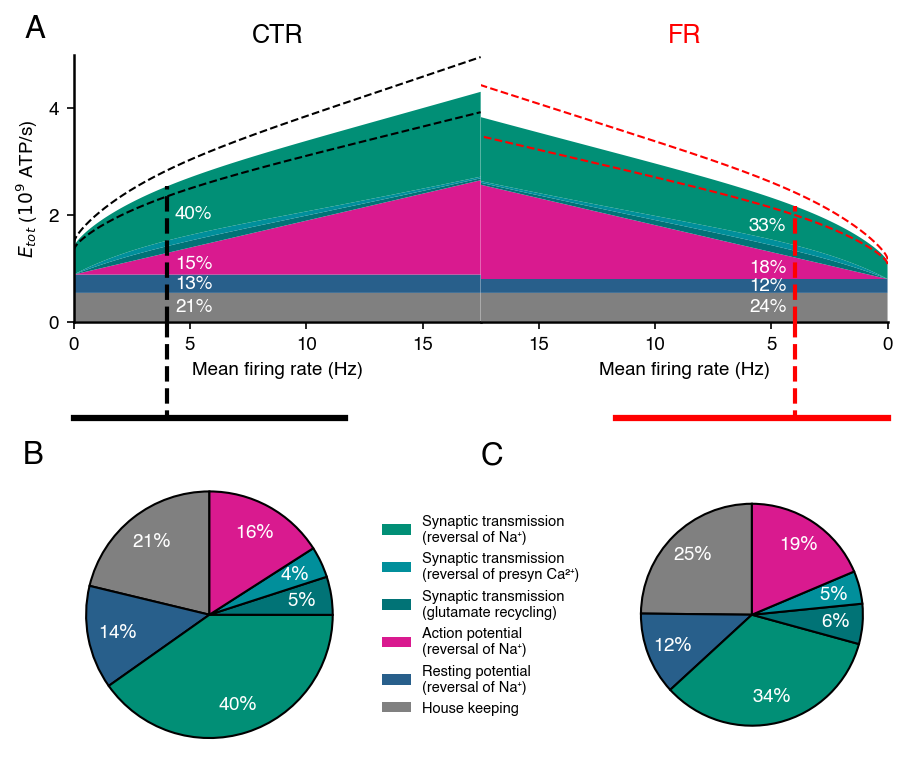

In [41]:
# plotting Fig. 3 data
importlib.reload(ppf)
ppf.fig_energy_budget(E_CTR, E_FR, r_post_fit, E_tot_minmax, colors=[color_CTR, color_FR], fontsizes=fontsizes, figsize=(7,6), savename_mode=True)
    

## Fig. 4

In [ ]:
# generate Fig. 4 data
# generate simulated data
grid_points = 11

R_m_values = np.linspace(50, 200, grid_points) # MOhm 
E_L_values = np.linspace(-90, -60, grid_points) # mV
w_scale_values = np.linspace(15, 240, grid_points) 
parameter_ranges = (R_m_values, E_L_values, w_scale_values)

model_mode = ['LIF', 'AdExp']
membrane_noise=1.0

results_AdExp = sf.multiple_grid_runs(number_grid_runs, parameter_ranges, model_mode, membrane_noise, starting_number=1, savename='Padamsey_grid')
# see python script: 3D_grid_run_cluster.py --> ready to store here

folder_path='../Data/Padamsey_grid'
results_mean =  af.load_and_process_multiple_results(savedname='Padamsey_grid',  model_mode=model_mode, folder_path=folder_path, results_mode='mean', spike_times_mode=False)

results_mean_spiking_trials = af.weight_results_by_spiking_trials(results_mean, results_number_data_points)

all_trajectories = af.predict_all_trajectories(results_mean_spiking_trials)

_, V_m_CTR_like, _, V_thresh = sf.simulate_single_run(data_CTR_like['R_m'], data_CTR_like['E_L'], data_CTR_like['w_scale'])
_, V_m_FR_like, _, V_thresh = sf.simulate_single_run(data_FR_like['R_m'], data_FR_like['E_L'], data_FR_like['w_scale'])

data_CTR_like['V_m'], data_CTR_like['V_thresh'] = V_m_CTR_like, V_thresh
data_FR_like['V_m'], data_FR_like['V_thresh'] = V_m_FR_like, V_thresh

In [141]:
# loading Fig. 4 data

with open('../Data/Jupyter_data/all_trajectories.pkl', 'rb') as f: 
    all_trajectories = pickle.load(f) 

with open('../Data/Jupyter_data/data_CTR_like.pkl', 'rb') as f: 
    data_CTR_like = pickle.load(f) 

with open('../Data/Jupyter_data/data_FR_like.pkl', 'rb') as f: 
    data_FR_like = pickle.load(f) 

V_m_CTR_like = data_CTR_like['V_m']
V_m_FR_like = data_FR_like['V_m']
V_thresh = data_CTR_like['V_thresh']

V_m_shifted_CTR_like, Delta_V_m_CTR_like = pf.shift_V_m(V_m_CTR_like, target_mV=0.0)
V_m_shifted_FR_like, Delta_V_m_FR_like = pf.shift_V_m(V_m_FR_like, target_mV=0.0)

V_m_excerpts_CTR_like, V_m_min_CTR_like, V_m_max_CTR_like, V_m_mean_CTR_like = pf.cut_into_excerpts(V_m_shifted_CTR_like, n_excerpts=9, start_idx=3000, stop_idx=30000)
V_m_excerpts_FR_like, V_m_min_FR_like, V_m_max_FR_like, V_m_mean_FR_like = pf.cut_into_excerpts(V_m_shifted_FR_like, n_excerpts=9, start_idx=3000, stop_idx=30000)

V_m_min, V_m_max = pf.compute_shared_ylim(V_m_min_CTR_like, V_m_max_CTR_like, V_m_min_FR_like, V_m_max_FR_like)

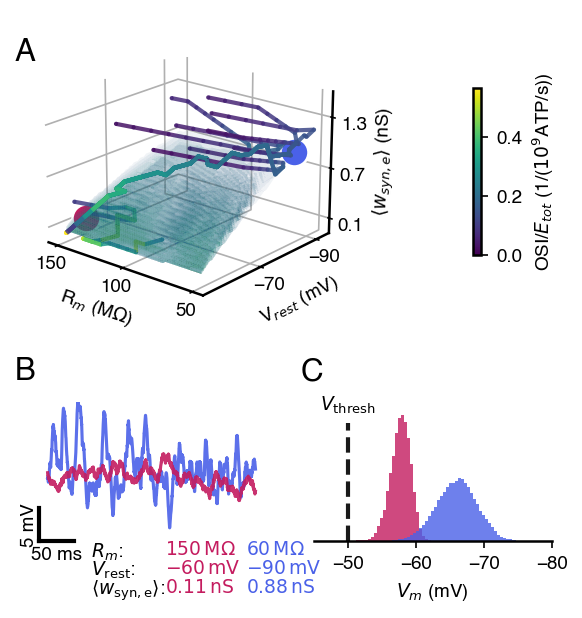

In [27]:
# plotting Fig. 4 data

#fig3d = pf.plot_interactive_3D(results_mean_spiking_trials, value_key='OSI_per_energy', title=None, lower_threshold=0.15, all_trajectories=all_trajectories, interpolation=True, axes_mode=True, base_font_size=35, eye=dict(x=-1.95, y=1.75, z=1.0), savename='fig_multiple_trajectory_examples_3d')
#ppf.fig_multiple_trajectories_examples(fig3d, data_CTR_like, data_FR_like, colors=[color_CTR_like, color_FR_like, color_CTR], fontsizes=fontsizes, figsize=(5, 8), savename_mode=True)

ppf.fig_multiple_trajectories_examples(results_mean_spiking_trials, all_trajectories, data_CTR_like, data_FR_like, colors=[color_CTR_like, color_FR_like, color_CTR], fontsizes=fontsizes, figsize=(4.5,5), savename_mode=True)



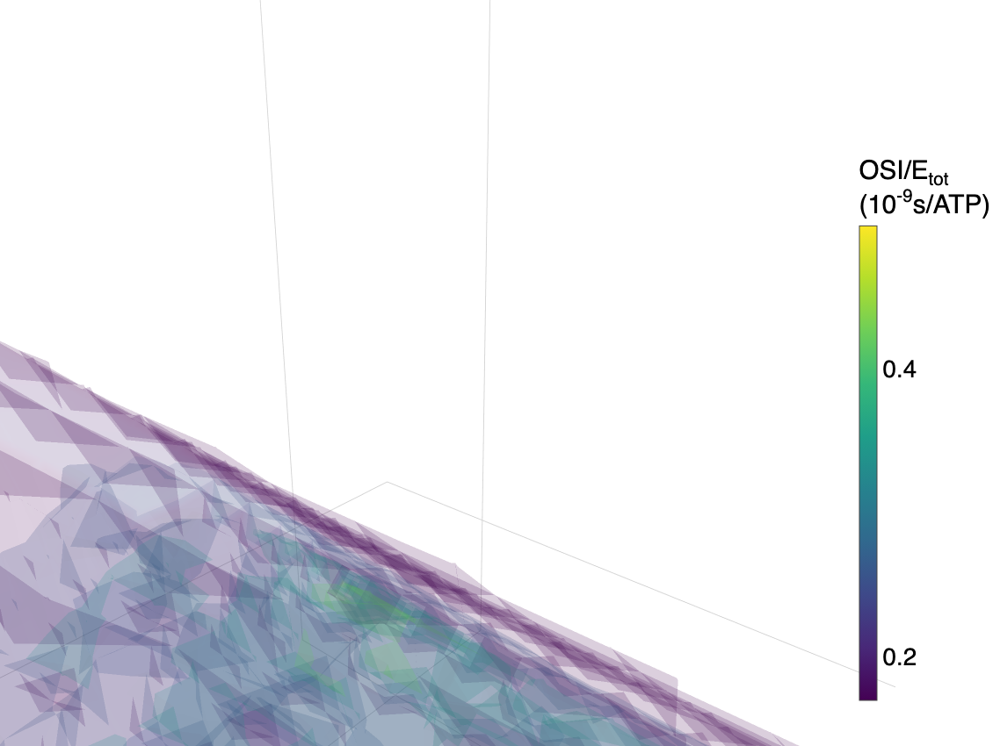

Video saved at ../Figures/vid_fig_1A_rotating.gif


In [153]:
# create Fig. 4 video

importlib.reload(pf)
importlib.reload(ppf)


eye=dict(x=1.81, y=-2.16, z=1.03)
duration=2
fps=5
base_font_size=37

n_longest = np.argmax([len(traj) for traj in all_trajectories]) # or 4500

vid_fig_4A = pf.plot_interactive_3D(results=results_mean_spiking_trials, value_key='OSI_per_energy', title=None, cmin=None, cmax=None, lower_threshold=0.17, upper_threshold=None, interpolation=True, all_trajectories=None, CTR_FR=None, exp_data=None, plot_ellipsoids=None, plot_exp_stems=None, colorbar_mode=True, legend_mode=False, axes_mode=False, base_font_size=base_font_size, eye=eye, show_mode=True)
pf.create_rotation_video(vid_fig_4A, "vid_fig_4A_rotating", trajectory=all_trajectories[n_longest], revealing=True, results=results_mean_spiking_trials, trajectory_value_key='OSI_per_energy', duration=duration, fps=fps, eye=eye)



## Fig. 5

In [ ]:
# generate Fig. 5 data

# simulate membrane noise effect 
number_single_runs = 1000
model_mode = ['LIF', 'AdExp']
membrane_noise_vec = np.linspace(0,8,11)
synaptic_scaling_mode='multiplicative'

results_single_runs_membrane_noise_CTR_FR_LIF, results_single_runs_membrane_noise_CTR_FR_AdExp = sf.multiple_CTR_FR_membrane_noise_runs(number_single_runs, model_mode, membrane_noise_vec, synaptic_scaling_mode=synaptic_scaling_mode, savename='membrane_noise')


In [29]:
# loading Fig. 5 data
# load mEPSC data 
mEPSC_avg_norm_CTR = [0.012643941,0.005958911,0.060236304,0.111356659,0.109533469,0.092027687,0.072896031,0.066692449,0.058523611,0.053819623,0.047639719,0.042422712,0.037229383,0.03318048,0.029439389,0.025051105,0.021744106,0.019036945,0.016456066,0.014072501,0.012170385,0.009676325,0.008279335,0.007569001,0.006606104,0.005509033,0.004869733,0.003922621,0.003472743,0.003062328,0.002841335,0.002059968]
mEPSC_avg_norm_FR = [0.028107958,0.069368703,0.187216933,0.204057676,0.140327202,0.1056105,0.077382383,0.054949626,0.037101396,0.025982069,0.0177558,0.012986413,0.009409372,0.00662723,0.00542564,0.003891302,0.003031703,0.002301507,0.001867086,0.001580553,0.001081431,0.000905814,0.000683982,0.000573066,0.000351234,0.000360477,0.000231075,0.000314262,0.000203346,0.000175617,0.000083187,0.000055458]

# load simulated data 
name_membrane_noise_CTR_FR = 'Padamsey_membrane_noise/20250825_membrane_noise_CTR_FR/20250825_cluster_results_single_runs_membrane_noise_CTR_FR_AdExp' 
results_single_runs_membrane_noise_CTR_FR = af.load_data(name_membrane_noise_CTR_FR)
results_membrane_noise_CTR = results_single_runs_membrane_noise_CTR_FR[0]
results_membrane_noise_FR = results_single_runs_membrane_noise_CTR_FR[1]
OSI_membrane_noise_CTR = results_membrane_noise_CTR['OSI']
OSI_membrane_noise_FR = results_membrane_noise_FR['OSI']
noise_levels = np.arange(len(OSI_membrane_noise_CTR))

# multiplicative scaling data, experimental noise level
name_ms_CTR = 'Padamsey_CTR_FR/20250806_CTR_FR/20250806_cluster_multiple_CTR_FR_runs_1_noise_multiplicative_results_single_runs_CTR_AdExp'
name_ms_FR = 'Padamsey_CTR_FR/20250806_CTR_FR/20250806_cluster_multiple_CTR_FR_runs_1_noise_multiplicative_results_single_runs_FR_AdExp'

results_ms_CTR = af.load_data(name_ms_CTR)
results_ms_FR = af.load_data(name_ms_FR)

tuning_curves_ms_CTR = results_ms_CTR['tuning_curve']
tuning_curves_ms_FR = results_ms_FR['tuning_curve']

# non-multiplicative scaling data, experimental noise level
name_nms_CTR = 'Padamsey_CTR_FR/20250806_CTR_FR/20250806_cluster_multiple_CTR_FR_runs_1_noise_nonmultiplicative_results_single_runs_CTR_AdExp'
name_nms_FR = 'Padamsey_CTR_FR/20250806_CTR_FR/20250806_cluster_multiple_CTR_FR_runs_1_noise_nonmultiplicative_results_single_runs_FR_AdExp'

results_nms_CTR = af.load_data(name_nms_CTR)
results_nms_FR = af.load_data(name_nms_FR)

tuning_curves_nms_CTR = results_nms_CTR['tuning_curve']
tuning_curves_nms_FR = results_nms_FR['tuning_curve']

energy (mult.): 1.75 10^9 ATP/s
firing rate (mult.): 1.11 Hz
energy (non-mult.): 1.69 10^9 ATP/s
firing rate (non-mult.): 0.78 Hz


1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp
Zapf NOT subset; don't know how to subset; dropped
feat NOT subset; don't know how to subset; dropped
morx NOT subset; don't know how to subset; dropped


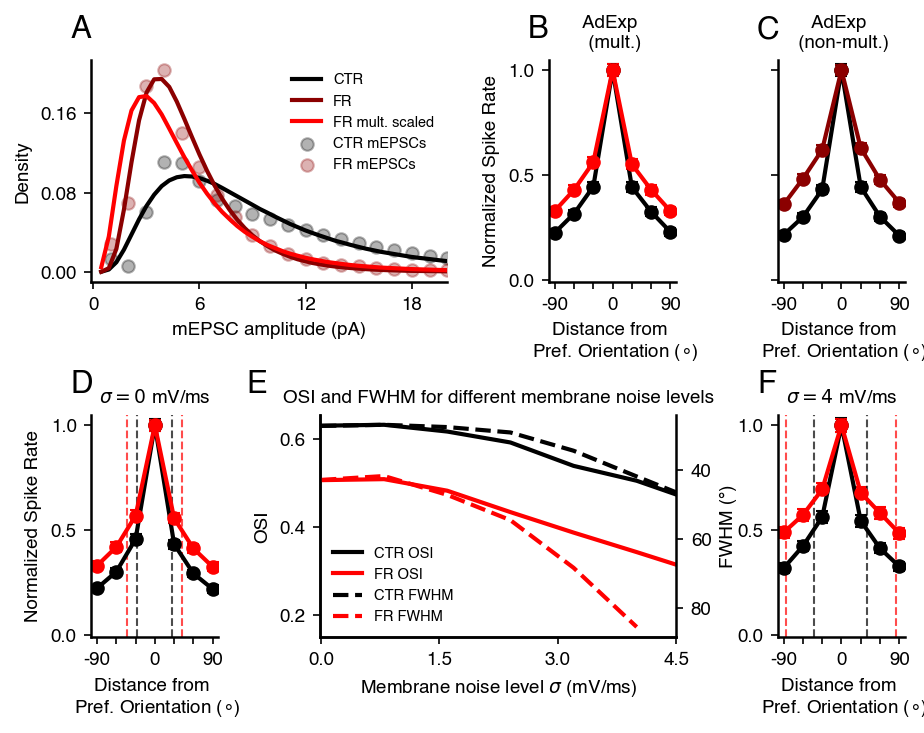

In [30]:
# plotting Fig. 5 data
print('energy (mult.): ' + str(round(np.mean(results_ms_FR['E_tot'])/1e9, 2)) + ' 10^9 ATP/s')
print('firing rate (mult.): ' + str(round(np.mean(results_ms_FR['r_post']), 2)) + ' Hz')
print('energy (non-mult.): ' + str(round(np.mean(results_nms_FR['E_tot'])/1e9, 2)) + ' 10^9 ATP/s')
print('firing rate (non-mult.): ' + str(round(np.mean(results_nms_FR['r_post']), 2)) + ' Hz')

ppf.fig_etiology_tuning_curve_broadening(mEPSC_avg_norm_CTR, mEPSC_avg_norm_FR, pf.lognormal,  tuning_curves_ms_CTR, tuning_curves_ms_FR, tuning_curves_nms_CTR, tuning_curves_nms_FR, results_membrane_noise_CTR, results_membrane_noise_FR, colors=[color_CTR, color_FR, color_FR_non_mult_scale], fontsizes=fontsizes, figsize=(7,5), savename_mode=True)


## Fig. 6

In [ ]:
# generate Fig. 6 data

# generate V_gap_variable data
number_V_gap_runs = 1000
V_gaps = np.linspace(0, 6, 1) 
model_mode = ['LIF', 'AdExp']
membrane_noise=1.0
results_multiple_V_gap_variable_runs_LIF, results_multiple_V_gap_variable_runs_AdExp = sf.multiple_V_gap_variable_runs(number_V_gap_runs=number_V_gap_runs, V_gaps=V_gaps, model_mode=model_mode, membrane_noise=membrane_noise, savename='V_gap_variable')
# see python script: multiple_V_gap_variable_runs_cluster.py

# generate V_gap_constant data
number_V_gap_runs = 1000
V_rests = np.linspace(-80, -60, 18)
Delta_V_thresh = 22 #
model_mode = ['LIF', 'AdExp']
membrane_noise=1.0
results_multiple_runs_V_gap_LIF, results_multiple_runs_V_gap_AdExp = sf.multiple_V_gap_constant_runs(number_V_gap_runs=number_V_gap_runs, V_rests=V_rests, Delta_V_thresh=Delta_V_thresh, model_mode=model_mode, membrane_noise=membrane_noise, savename='V_gap_constant')
# see python script: multiple_V_gap_constant_runs_cluster.py



In [31]:
# loading Fig. 6 data
# load V_gap constant data
name_V_gap_constant = 'Padamsey_V_gap_constant/20250904_V_gap_constant_membrane_noise/20250904_cluster_w_scale_85_membrane_noise_1_results_multiple_CTR_FR_V_gap_constant_runs_AdExp' 
results_multiple_CTR_FR_runs_V_gap_AdExp = af.load_data(name_V_gap_constant)

# load V_gap variable data
name_V_gap_variable = 'Padamsey_V_gap_variable/20250925_V_gap_variable/20250925_cluster_results_multiple_V_gap_variable_runs_AdExp'
results_V_gap_variable = af.load_data(name_V_gap_variable)
results_V_gap_variable_E_L = results_V_gap_variable[0]
results_V_gap_variable_V_thresh = results_V_gap_variable[1]


1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp
Zapf NOT subset; don't know how to subset; dropped
feat NOT subset; don't know how to subset; dropped
morx NOT subset; don't know how to subset; dropped


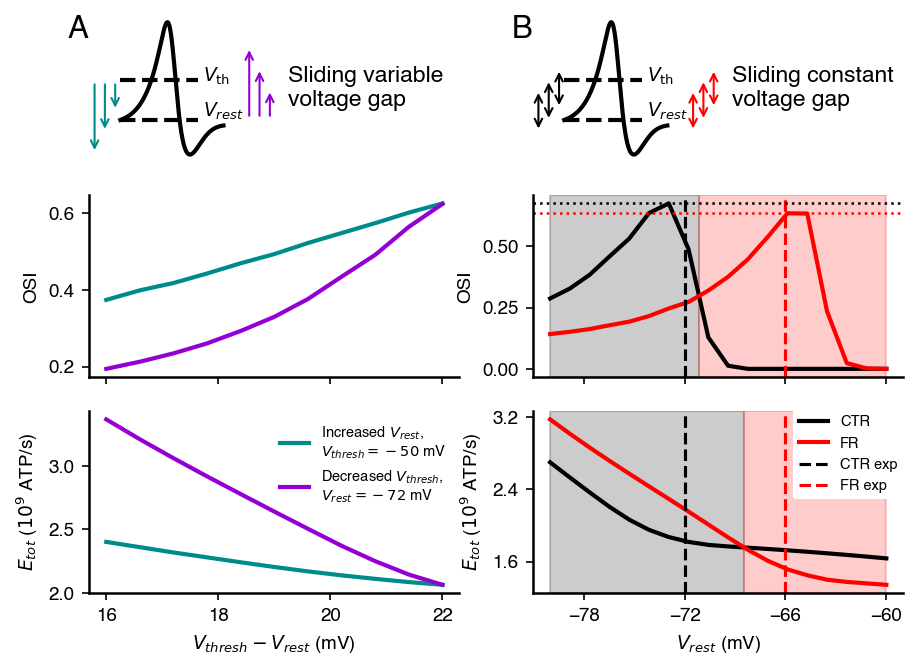

In [32]:
# plotting Fig. 6 data

ppf.fig_V_gap(results_multiple_CTR_FR_runs_V_gap_AdExp, results_V_gap_variable_E_L, results_V_gap_variable_V_thresh, colors=[color_CTR, color_FR, color_V_rest_var, color_V_thresh_var], fontsizes=fontsizes, figsize=(7,5), savename_mode=True)


## Fig. S1

In [128]:
# generate Fig. S1 data

# define synaptic input
N_syn, N_e, N_e_signal_ratio, N_i, rate_background_ratio, mu_rate_e, sigma_rate_e, mu_rate_i, sigma_rate_i, mu_weight_e_CTR, sigma_weight_e_CTR, mu_weight_i_CTR, sigma_weight_i_CTR, mu_weight_e_FR, sigma_weight_e_FR, mu_weight_i_FR, sigma_weight_i_FR = sif.synaptic_parameters(synaptic_scaling_mode='non-multiplicative')
N_syn = 10
N_e = 50
N_i = 10
w_e_0, w_i_0, spike_times_e, spike_times_i, r_e, r_i, t_stim, T, N_e_signal, N_e_noise = sif.orientation_variation_input(N_e, N_i, N_e_signal_ratio, mu_rate_e, sigma_rate_e, mu_rate_i, sigma_rate_i, rate_background_ratio, mu_weight_e_CTR, sigma_weight_e_CTR, mu_weight_i_CTR, sigma_weight_i_CTR)

w_e_CTR, _, _, _, _, _ =  sif.homogeneous_synaptic_input(0, N_e_noise, N_i, mu_rate_e, sigma_rate_e, mu_rate_i, sigma_rate_i, mu_weight_e_CTR, sigma_weight_e_CTR, mu_weight_i_CTR, sigma_weight_i_CTR)
w_e_FR, _, _, _, _, _ =  sif.homogeneous_synaptic_input(0, N_e_noise, N_i, mu_rate_e, sigma_rate_e, mu_rate_i, sigma_rate_i, mu_weight_e_FR, sigma_weight_e_FR, mu_weight_i_FR, sigma_weight_i_FR)


Grating orientation: 0 degree , preference ratio: 0.0
Grating orientation: 30 degree , preference ratio: 0.33
Grating orientation: 60 degree , preference ratio: 0.67
Grating orientation: 90 degree , preference ratio: 1.0
Grating orientation: 120 degree , preference ratio: 0.67
Grating orientation: 150 degree , preference ratio: 0.33
Grating orientation: 180 degree , preference ratio: 0.0


In [33]:
# loading Fig. S1 data

with open("../Data/Padamsey_synaptic_input/synaptic_input.pkl", "rb") as f:
    synaptic_input_loaded = pickle.load(f)

w_e_0, r_e, N_e_noise, spike_times_e, spike_times_i, w_e_CTR, w_e_FR = (synaptic_input_loaded[k] for k in ('w_e_0', 'r_e', 'N_e_noise', 'spike_times_e', 'spike_times_i', 'w_e_CTR', 'w_e_FR'))


1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp
Zapf NOT subset; don't know how to subset; dropped
feat NOT subset; don't know how to subset; dropped
morx NOT subset; don't know how to subset; dropped


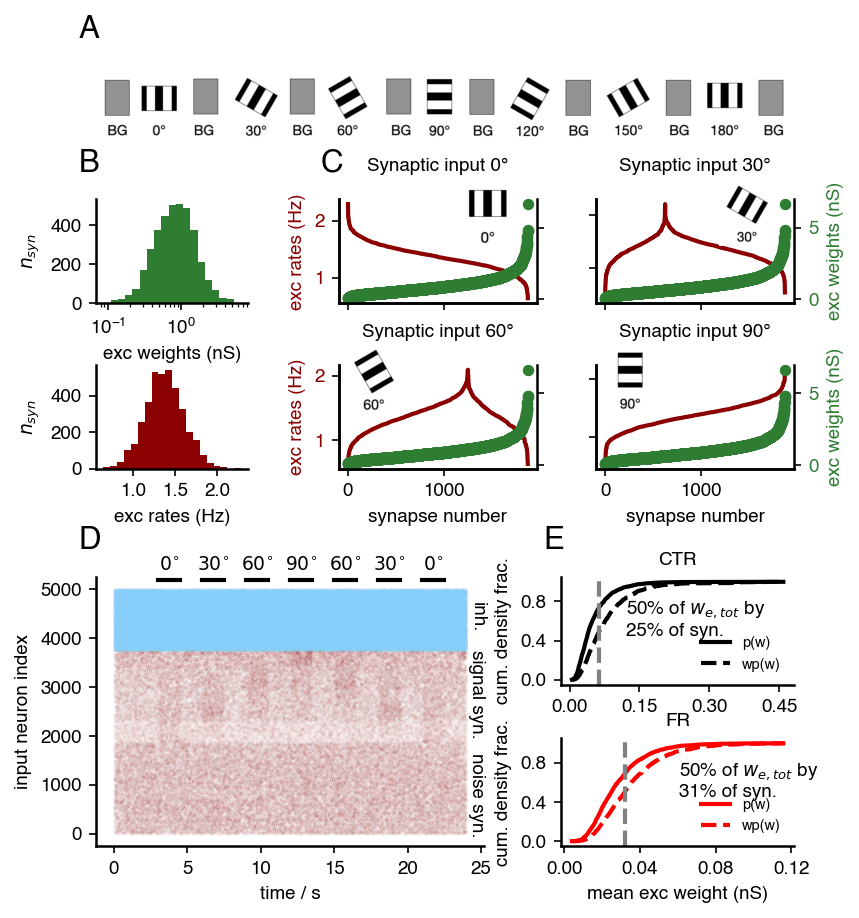

In [34]:
# plotting Fig. S1 data

ppf.fig_synaptic_input(w_e_0, r_e, N_e_noise, spike_times_e, spike_times_i, w_e_CTR, w_e_FR, colors=[color_w_e, color_r_e, color_input_exc, color_input_inh, color_CTR, color_FR], fontsizes=fontsizes, figsize=(6,7), savename_mode=True)


## Fig. S2

In [ ]:
# generate Fig. S2 data

# multiple simulations with different number of signaling synapses
number_single_runs = 10
model_mode='AdExp'
N_e_signal_ratios=[0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]

for ratio in N_e_signal_ratios: 
    percent = int(round(ratio*100)) # convert ratios in percentages for saving names
    savename = f'{savename_basic}_{percent}'
    results_single_runs_CTR_LIF, results_single_runs_FR_LIF, results_single_runs_CTR_AdExp, results_single_runs_FR_AdExp = multiple_CTR_FR_N_e_signal_ratio_runs(number_single_runs, model_mode, membrane_noise=0.0, synaptic_scaling_mode='multiplicative', N_e_signal_ratio=ratio, savename='Padamsey_N_exc_signal/20251024_N_exc_signal/20251024_tuning_curve_N_e_signal_ratio')

# run --> multiple_CTR_FR_N_e_signal_ratio_runs_cluster.py

In [35]:
# loading Fig. S2 data

#pf.load_and_plot_tuning_curves_N_e_signal_ratios(model_mode, N_e_signal_ratios, 'Padamsey_N_exc_signal/20251024_N_exc_signal/20251024_tuning_curve_N_e_signal_ratio')


Excluded 0 non-spiking of 500 CTR trials and 0 non-spiking of 500 FR trials.
Excluded 0 non-spiking of 500 CTR trials and 0 non-spiking of 500 FR trials.
Excluded 0 non-spiking of 500 CTR trials and 0 non-spiking of 500 FR trials.
Excluded 0 non-spiking of 500 CTR trials and 0 non-spiking of 500 FR trials.
Excluded 0 non-spiking of 500 CTR trials and 0 non-spiking of 500 FR trials.
Excluded 0 non-spiking of 500 CTR trials and 0 non-spiking of 500 FR trials.
Excluded 0 non-spiking of 500 CTR trials and 0 non-spiking of 500 FR trials.
Excluded 0 non-spiking of 500 CTR trials and 0 non-spiking of 500 FR trials.
Excluded 0 non-spiking of 500 CTR trials and 0 non-spiking of 500 FR trials.


1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp
Zapf NOT subset; don't know how to subset; dropped
feat NOT subset; don't know how to subset; dropped
morx NOT subset; don't know how to subset; dropped


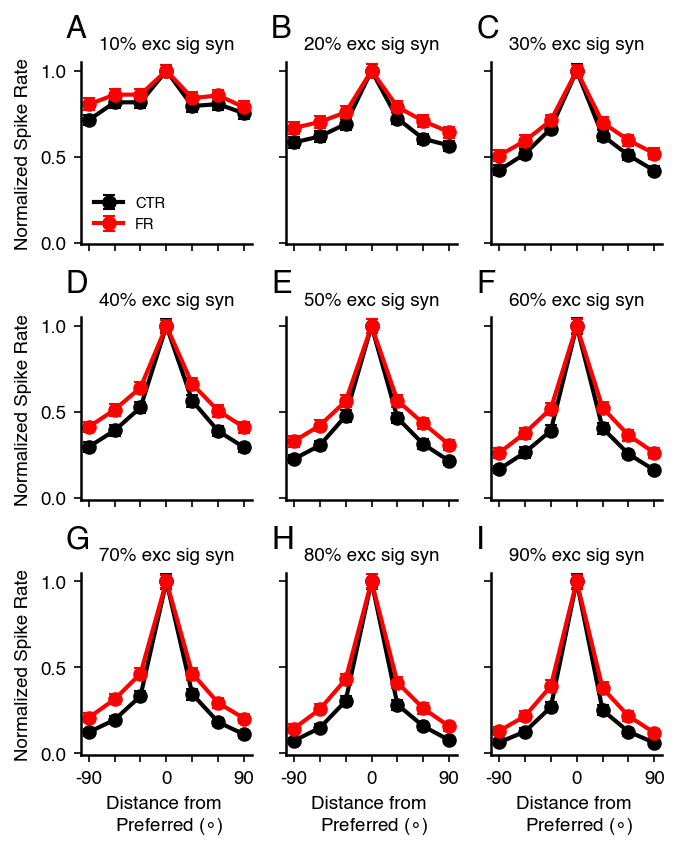

In [36]:
# plotting Fig. S2 data
model_mode='AdExp'
N_e_signal_ratios=[0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]

ppf.fig_3x3_tuning_curves_N_exc_signal(model_mode=model_mode, N_e_signal_ratios=N_e_signal_ratios, savename_basic='Padamsey_N_exc_signal/20251024_N_exc_signal/20251024_tuning_curve_N_e_signal_ratio', normalized=True, mean_over_zeros=False, mode='tuning_curve', colors=[color_CTR, color_FR], figsize=(5,6), fontsizes=fontsizes, savename_mode=True)


## Fig. S3

In [ ]:
# generate Fig. S3 data

# run multiple runs
number_single_runs = 1000
membrane_noise=1.0
synaptic_scaling_mode='multiplicative'
savename='20251024_LIF_ad_exp_AdExp'
results_single_runs_CTR_LIF, results_single_runs_FR_LIF, results_single_runs_CTR_LIFexp, results_single_runs_FR_LIFexp, results_single_runs_CTR_LIFad, results_single_runs_FR_LIFad, results_single_runs_CTR_AdExp, results_single_runs_FR_AdExp = sf.multiple_CTR_FR_ad_or_exp_runs(number_single_runs, membrane_noise=membrane_noise, synaptic_scaling_mode=synaptic_scaling_mode, savename=savename)
# run --> multiple_CTR_FR_ad_or_exp_runs_cluster.py


In [37]:
# loading Fig. S3 data

# run multiple runs

savename='20251024_LIF_ad_exp_AdExp'

name_single_runs_CTR_LIF = f'Padamsey_ad_or_exp/20251024_ad_or_exp/{savename}_results_single_runs_CTR_LIF'
results_single_runs_CTR_LIF = af.load_data(name_single_runs_CTR_LIF)
tuning_curves_CTR_LIF = results_single_runs_CTR_LIF['tuning_curve']

name_single_runs_FR_LIF = f'Padamsey_ad_or_exp/20251024_ad_or_exp/{savename}_results_single_runs_FR_LIF'
results_single_runs_FR_LIF = af.load_data(name_single_runs_FR_LIF)
tuning_curves_FR_LIF = results_single_runs_FR_LIF['tuning_curve']

name_single_runs_CTR_LIFexp = f'Padamsey_ad_or_exp/20251024_ad_or_exp/{savename}_results_single_runs_CTR_LIFexp'
results_single_runs_CTR_LIFexp = af.load_data(name_single_runs_CTR_LIFexp)
tuning_curves_CTR_LIFexp = results_single_runs_CTR_LIFexp['tuning_curve']

name_single_runs_FR_LIFexp = f'Padamsey_ad_or_exp/20251024_ad_or_exp/{savename}_results_single_runs_FR_LIFexp'
results_single_runs_FR_LIFexp = af.load_data(name_single_runs_FR_LIFexp)
tuning_curves_FR_LIFexp = results_single_runs_FR_LIFexp['tuning_curve']

name_single_runs_CTR_LIFad = f'Padamsey_ad_or_exp/20251024_ad_or_exp/{savename}_results_single_runs_CTR_LIFad'
results_single_runs_CTR_LIFad = af.load_data(name_single_runs_CTR_LIFad)
tuning_curves_CTR_LIFad = results_single_runs_CTR_LIFad['tuning_curve']

name_single_runs_FR_LIFad = f'Padamsey_ad_or_exp/20251024_ad_or_exp/{savename}_results_single_runs_FR_LIFad'
results_single_runs_FR_LIFad = af.load_data(name_single_runs_FR_LIFad)
tuning_curves_FR_LIFad = results_single_runs_FR_LIFad['tuning_curve']

name_single_runs_CTR_AdExp = f'Padamsey_ad_or_exp/20251024_ad_or_exp/{savename}_results_single_runs_CTR_AdExp'
results_single_runs_CTR_AdExp = af.load_data(name_single_runs_CTR_AdExp)
tuning_curves_CTR_AdExp = results_single_runs_CTR_AdExp['tuning_curve']

name_single_runs_FR_AdExp = f'Padamsey_ad_or_exp/20251024_ad_or_exp/{savename}_results_single_runs_FR_AdExp'
results_single_runs_FR_AdExp = af.load_data(name_single_runs_FR_AdExp)
tuning_curves_FR_AdExp = results_single_runs_FR_AdExp['tuning_curve']

C_m, E_L_CTR, R_m_CTR, g_L_CTR, V_thresh, V_reset_CTR, rate_window, E_e, E_i, tau_e, tau_i, Delta_T_ad, tau_w_ad, a_ad, b_ad, membrane_noise = sf.sim_parameters(parameter_mode='CTR', membrane_noise=1.0)
C_m, E_L_FR, R_m_FR, g_L_FR, V_thresh, V_reset_FR, rate_window, E_e, E_i, tau_e, tau_i, Delta_T_ad, tau_w_ad, a_ad, b_ad, membrane_noise = sf.sim_parameters(parameter_mode='FR', membrane_noise=1.0)


WARNING    /Users/psommer/Desktop/Energy-function-trade-off/Code/Functions/paper_plotting_functions.py:1148: UserWarning:

This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.

 [py.warnings]


Excluded 0 non-spiking of 500 CTR trials and 0 non-spiking of 500 FR trials.
Excluded 0 non-spiking of 500 CTR trials and 0 non-spiking of 500 FR trials.
Excluded 0 non-spiking of 500 CTR trials and 0 non-spiking of 500 FR trials.
Excluded 0 non-spiking of 500 CTR trials and 0 non-spiking of 500 FR trials.


1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp
Zapf NOT subset; don't know how to subset; dropped
feat NOT subset; don't know how to subset; dropped
morx NOT subset; don't know how to subset; dropped


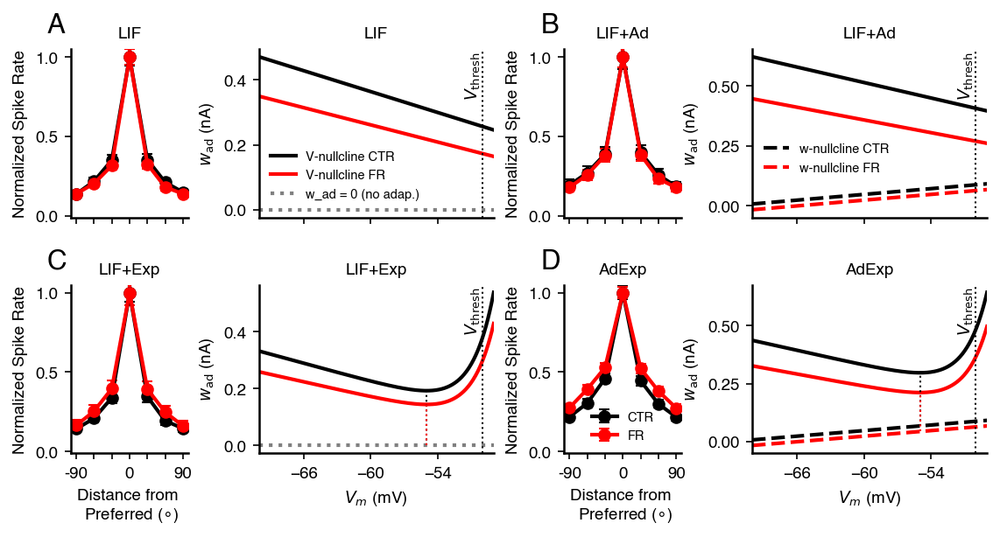

In [38]:
# plotting Fig. S3 data
ppf.fig_tuning_and_phaseplanes_2x2(results_single_runs_CTR_LIF, results_single_runs_FR_LIF, results_single_runs_CTR_LIFad, results_single_runs_FR_LIFad, results_single_runs_CTR_LIFexp, results_single_runs_FR_LIFexp, results_single_runs_CTR_AdExp, results_single_runs_FR_AdExp, g_L_CTR, g_L_FR, E_L_CTR, E_L_FR, V_thresh, Delta_T_ad, a_ad, tau_w_ad, normalized=True, mean_over_zeros=False, mode='tuning_curve', titles=("LIF","LIF+Ad","LIF+Exp","AdExp"), colors=[color_CTR, color_FR], fontsizes=fontsizes, figsize=(9,4), savename_mode=True)


## Fig. S4

In [ ]:
# generate Fig. S4 data

grid_points = 11

R_m_values = np.linspace(50, 200, grid_points) # MOhm 
E_L_values = np.linspace(-90, -60, grid_points) # mV
w_scale_values = np.linspace(15, 240, grid_points) 
parameter_ranges = (R_m_values, E_L_values, w_scale_values)

model_mode = ['LIF', 'AdExp']
membrane_noise=1.0

results_AdExp = sf.multiple_grid_runs(number_grid_runs, parameter_ranges, model_mode, membrane_noise, starting_number=1, savename='Padamsey_grid')
# see python script: 3D_grid_run_cluster.py --> ready to store here

folder_path='../Data/Padamsey_grid'
results_mean =  af.load_and_process_multiple_results(savedname='Padamsey_grid',  model_mode=model_mode, folder_path=folder_path, results_mode='mean', spike_times_mode=False)

results_mean_spiking_trials = af.weight_results_by_spiking_trials(results_mean, results_number_data_points)


In [39]:
# loading Fig. S4 data
with open('../Data/Padamsey_grid/updated_final_Padamsey_grid.pkl', 'rb') as f: 
    results_mean_spiking_trials = pickle.load(f) 


WARNING    /Users/psommer/Desktop/Energy-function-trade-off/Code/Functions/paper_plotting_functions.py:1216: UserWarning:

This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.

 [py.warnings]
1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp
Zapf NOT subset; don't know how to subset; dropped
feat NOT subset; don't know how to subset; dropped
morx NOT subset; don't know how to subset; dropped


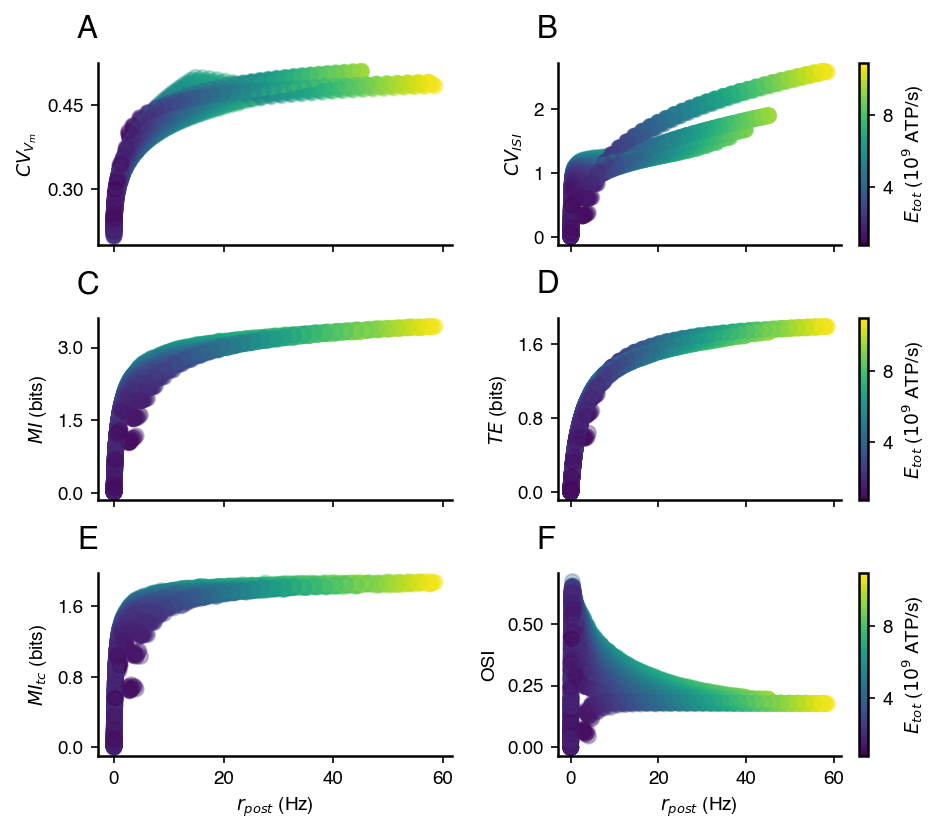

In [40]:
# plotting Fig. S4 data

ppf.fig_information(results_mean_spiking_trials, fontsizes=fontsizes, figsize=(7,6), savename_mode=True)


## Fig. S5

In [ ]:
# generate Fig. S5 data

# define synaptic input
N_syn, N_e, N_e_signal_ratio, N_i, rate_background_ratio, mu_rate_e, sigma_rate_e, mu_rate_i, sigma_rate_i, mu_weight_e, sigma_weight_e, mu_weight_i, sigma_weight_i = sif.synaptic_parameters(synaptic_scaling_mode='multiplicative')

# orientation variation input
w_e_0, w_i_0, spike_times_e, spike_times_i, r_e, r_i, t_stim, T, N_e_signal, N_e_noise = sif.orientation_variation_input(N_e, N_i, N_e_signal_ratio, mu_rate_e, sigma_rate_e, mu_rate_i, sigma_rate_i, rate_background_ratio, mu_weight_e, sigma_weight_e, mu_weight_i, sigma_weight_i)
#plot_raster(spike_times_e, spike_times_i, savename='raster_plot')

# scale synaptic input
w_scale = 130 #130
w_e = w_e_0 * 5 * w_scale * 4 # low E/I balance: 4/1
w_i = w_i_0 * 5 * w_scale * 1 # low E/I balance: 4/1

# CTR run
C_m, E_L, R_m, g_L, V_thresh, V_reset, rate_window, E_e, E_i, tau_e, tau_i, Delta_T_ad, tau_w_ad, a_ad, b_ad, sigma_membrane_noise = sf.sim_parameters(parameter_mode='CTR', membrane_noise=0.0)

# translate them to Brian-readable values
T_b, N_e, N_i, spike_times_e, spike_times_i, E_e_b, E_i_b, w_e_b, w_i_b, tau_e_b, tau_i_b, C_m_b, g_L_b, E_L_b, V_thresh_b, V_reset_b, rate_window_b, Delta_T_ad_b, tau_w_ad_b, a_ad_b, b_ad_b, sigma_membrane_noise_b = sf.parameters_brian(T, N_e, N_i, spike_times_e, spike_times_i, E_e, E_i, w_e, w_i, tau_e, tau_i, C_m, g_L, E_L, V_thresh, V_reset, rate_window, Delta_T_ad, tau_w_ad, a_ad, b_ad, sigma_membrane_noise)

# simulate LIF
#time, V_m, spike_times_post, rate_estimate_post, I_syn_e, I_syn_i, g_e, g_i = sf.LIF(T_b, N_e, N_i, spike_times_e, spike_times_i, E_e_b, E_i_b, w_e_b, w_i_b, tau_e_b, tau_i_b, C_m_b, g_L_b, E_L_b, V_thresh_b, V_reset_b, rate_window_b, sigma_membrane_noise_b)

# simulate AdExp

time, V_m, spike_times_post, rate_estimate_post, I_syn_e, I_syn_i, g_e, g_i = sf.AdExp(T_b, N_e, N_i, spike_times_e, spike_times_i, E_e_b, E_i_b, w_e_b, w_i_b, tau_e_b, tau_i_b, C_m_b, g_L_b, E_L_b, V_thresh_b, V_reset_b, Delta_T_ad_b, tau_w_ad_b, a_ad_b, b_ad_b, rate_window_b, sigma_membrane_noise_b)

results_CTR_single_run = {"time": time, "V_m": V_m, "spike_times_post": spike_times_post, "rate_estimate_post": rate_estimate_post, "I_syn_e": I_syn_e, "I_syn_i": I_syn_i, "g_e": g_e, "g_i": g_i, "w_e_0": w_e_0, "w_i_0": w_i_0, "spike_times_e": spike_times_e, "spike_times_i": spike_times_i, "r_e": r_e, "r_i": r_i, "t_stim": t_stim, "T": T, "N_e_signal": N_e_signal, "N_e_noise": N_e_noise}


In [59]:
# loading Fig. S5 data
with open('../Data/Padamsey_experimental_single_run/CTR_single_run.pkl', 'rb') as f:
    results_CTR_single_run = pickle.load(f)

w_e_0, w_i_0, spike_times_e, spike_times_i, r_e, r_i, t_stim, T, N_e_signal, N_e_noise = (results_CTR_single_run[k] for k in ["w_e_0","w_i_0","spike_times_e","spike_times_i","r_e","r_i","t_stim","T","N_e_signal","N_e_noise"])
time, V_m, spike_times_post, rate_estimate_post, I_syn_e, I_syn_i, g_e, g_i = (results_CTR_single_run[k] for k in ["time","V_m","spike_times_post","rate_estimate_post","I_syn_e","I_syn_i","g_e","g_i"])

bin_time_range = np.linspace(100, 1500, 40) # in ms # previously up to 2000 ms but greater than the stimulus presentation window
bins_rate_range = np.linspace(10, 200, 40)
binning_results = af.get_optimal_bin_sizes(spike_times_post, spike_times_e, w_e_0, T, bin_time_range, bins_rate_range)


Optimal MI combination: bin_time     1320.000000
bins_rate     190.000000
mi_bin          1.335506
te_bin          0.117647
Name: 1397, dtype: float64
Optimal TE combination: bin_time     1320.000000
bins_rate      34.000000
mi_bin          0.621353
te_bin          0.991456
Name: 1365, dtype: float64


1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp
Zapf NOT subset; don't know how to subset; dropped
feat NOT subset; don't know how to subset; dropped
morx NOT subset; don't know how to subset; dropped


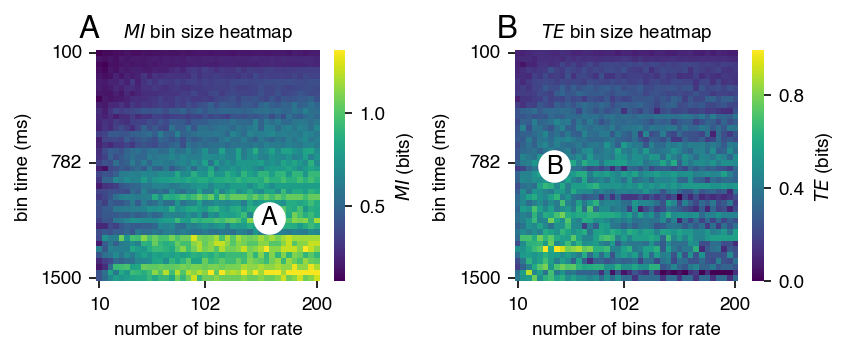

In [60]:
# plotting Fig. S5 data
ppf.fig_info_binsizes(binning_results, fontsizes=fontsizes, figsize=(6,2), savename_mode=True)


## Fig. S6

In [ ]:
# generate Fig. S6 data

In [37]:
# loading Fig. S6 data
with open('../Data/detailed_model/currents_subthreshold.pkl', 'rb') as f:
    currents_subthreshold = pickle.load(f)

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp
Zapf NOT subset; don't know how to subset; dropped
feat NOT subset; don't know how to subset; dropped
morx NOT subset; don't know how to subset; dropped


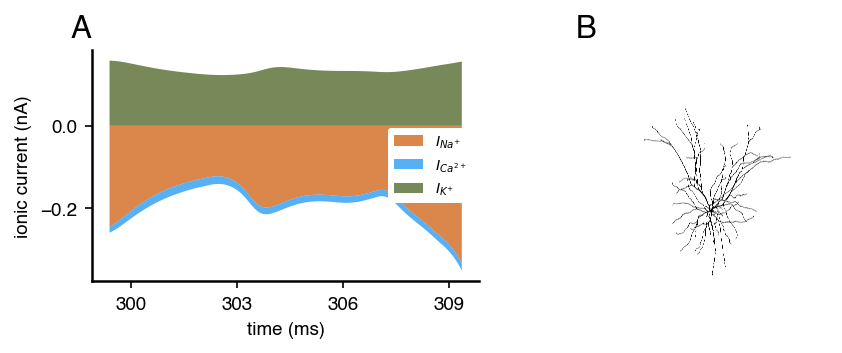

In [39]:
# plotting Fig. S6 data

ppf.fig_A_syn_estimation(currents_subthreshold, colors=[color_K, color_Na, color_Ca], fontsizes=fontsizes, figsize=(7,2), savename_mode=True)


## Fig. S7

In [ ]:
# generate Fig. S7 data
w_e_scale_list = np.linspace(70, 350, 20) #20
tau_list = [1, 50, 100, 250, 500] # in ms
savename = "results_adaptation"

results_adaptation = sf.multiple_adaptation_runs(w_e_scale_list, tau_list, savename)


In [63]:
# loading Fig. S7 data

# load adaptation runs data 
with open('../Data/Padamsey_adaptation_runs/results_adaptation.pkl', 'rb') as f:
    results_adaptation = pickle.load(f)

r_post_list = []
w_ad_list = []
I_syn_e_list = []
labels_list = []
ratio_list = []

for res in results_adaptation:
    r_post_list.append(res['r_post_list'])
    w_ad_list.append(res['w_ad_list'])
    I_syn_e_list.append(res['I_syn_e_list'])
    ratio_list.append(np.where(np.array(res['w_ad_list']) != 0, np.array(res['w_ad_list']) / np.array(res['I_syn_e_list']) * 100, np.nan)) 
    labels_list.append(f"$\\tau_{{ad}}$ = {res['tau_w_ad']} ms")

# load detailed model data
with open('../Data/detailed_model/AP_adaptation.pkl', 'rb') as f:
    AP_adaptation = pickle.load(f)

with open('../Data/detailed_model/ionic_currents_adaptation.pkl', 'rb') as f:
    ionic_currents_adaptation = pickle.load(f)

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp
Zapf NOT subset; don't know how to subset; dropped
feat NOT subset; don't know how to subset; dropped
morx NOT subset; don't know how to subset; dropped


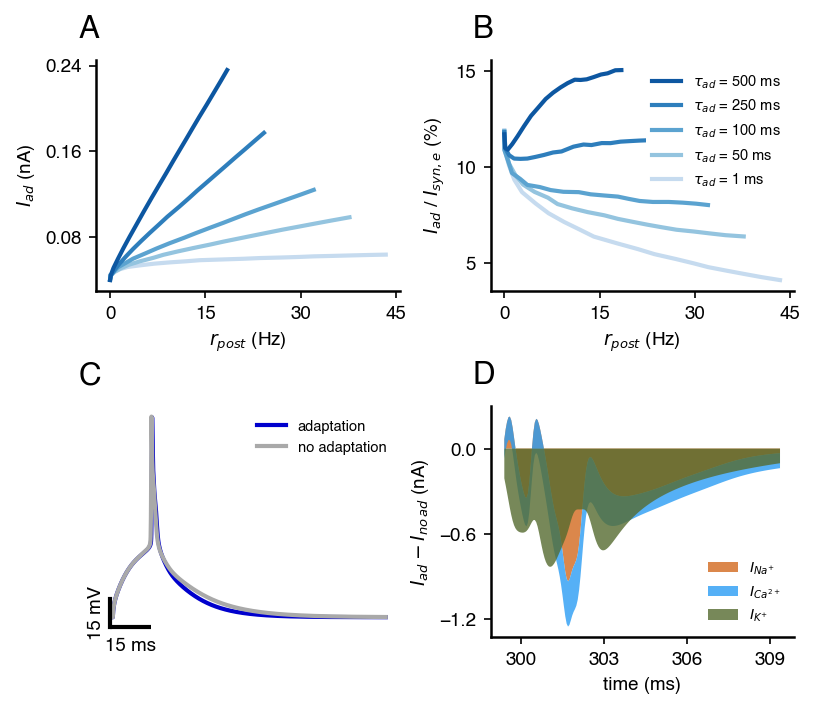

In [65]:
# plotting Fig. S7 data

ppf.fig_adaptation_currents(r_post_list, w_ad_list, ratio_list, labels_list, AP_adaptation, ionic_currents_adaptation, colors=[colors_ad, color_AP_no_ad, color_AP_ad, color_K, color_Na, color_Ca], fontsizes=fontsizes, figsize=(6,5), savename_mode=True)


## Fig. S8

In [ ]:
# generate Fig. S8 data

In [ ]:
# loading Fig. S8 data

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp
Zapf NOT subset; don't know how to subset; dropped
feat NOT subset; don't know how to subset; dropped
morx NOT subset; don't know how to subset; dropped


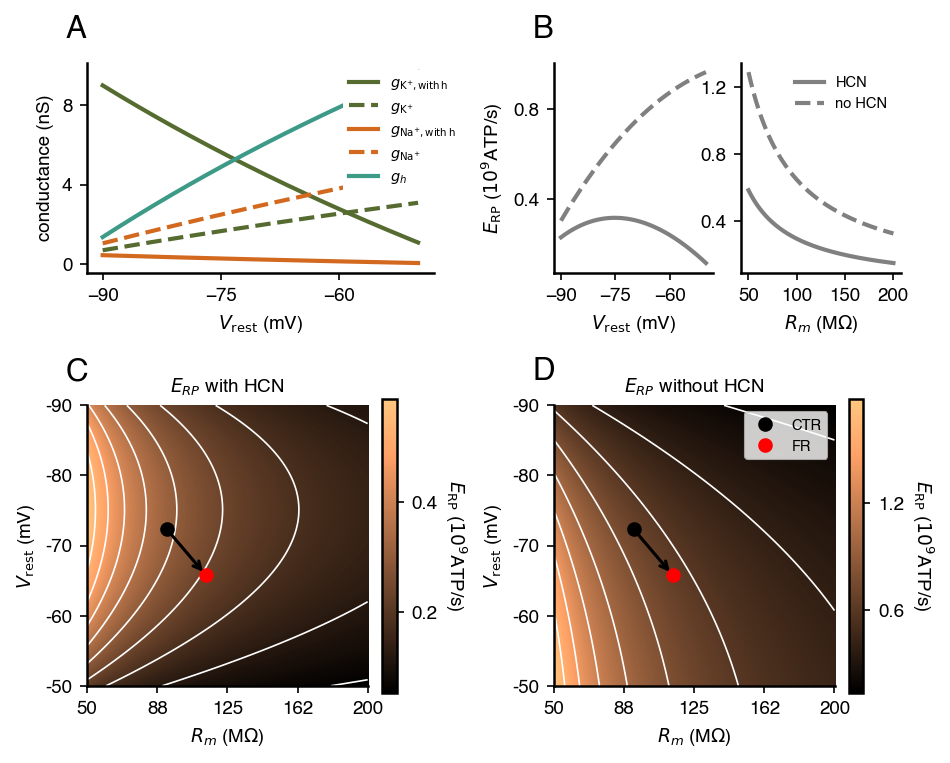

In [9]:
# plotting Fig. S8 data


ppf.fig_energy_budget_comparison(colors=[color_K, color_Na, color_h], fontsizes=fontsizes, figsize=(7,6), savename_mode=True)


## Fig. S9

In [38]:
# generate Fig. S9 data
# import model data

# CTR data
w_scales_CTR = [46.42857142857143, 49.48979591836735, 52.55102040816327, 55.61224489795919, 58.6734693877551, 61.73469387755102, 64.79591836734693, 67.85714285714286, 70.91836734693877, 73.9795918367347, 77.0408163265306, 80.10204081632654, 83.16326530612244, 86.22448979591837, 89.28571428571428, 92.3469387755102, 95.40816326530611, 98.46938775510203, 101.53061224489795, 104.59183673469387, 107.65306122448979, 110.71428571428571, 113.77551020408163, 116.83673469387755, 119.89795918367346, 122.95918367346938, 126.0204081632653, 129.0816326530612, 132.14285714285714, 135.20408163265307, 138.26530612244898, 141.32653061224488, 144.3877551020408, 147.44897959183675, 150.51020408163265, 153.57142857142856, 156.6326530612245, 159.6938775510204, 162.75510204081633, 165.81632653061223, 168.87755102040816, 171.93877551020407, 175.0]
r_post_CTR = [0.0, 0.041666666666666664, 0.041666666666666664, 0.08333333333333333, 0.125, 0.20833333333333334, 0.20833333333333334, 0.2916666666666667, 0.5416666666666666, 0.8333333333333334, 0.9166666666666666, 1.2083333333333335, 1.2916666666666667, 1.5833333333333333, 1.75, 2.0416666666666665, 2.5, 2.7916666666666665, 3.1666666666666665, 3.5416666666666665, 3.9166666666666665, 4.333333333333333, 4.75, 5.208333333333333, 5.875, 6.541666666666667, 6.958333333333334, 7.5, 8.125, 8.958333333333334, 9.5, 10.333333333333334, 10.958333333333334, 11.625, 12.291666666666666, 12.916666666666666, 13.75, 14.5, 15.208333333333334, 16.375, 17.0, 17.541666666666668, 18.25]
I_syn_e_CTR = [0.20468990686665456, 0.21716708012996896, 0.2295716877427581, 0.24192811134369965, 0.25423312488949124, 0.26650002497180364, 0.278699523997471, 0.29087948256367735, 0.3030680489861614, 0.3152372783314829, 0.3273190015062498, 0.33942846954324357, 0.3514511422548076, 0.36350823918486813, 0.37550591739271805, 0.3875156358386346, 0.39955257200231953, 0.4115323181656564, 0.42351477904140383, 0.4354734356586195, 0.4474183832312191, 0.45936804268173653, 0.4712989806823503, 0.4832281473851835, 0.4952161219752156, 0.5071903109928454, 0.5190841696483622, 0.5310022341888898, 0.5429309111751601, 0.5549292752560945, 0.56682045052791, 0.5787961027423827, 0.590711214330683, 0.6026274391088663, 0.6145258126780432, 0.6264146997986371, 0.6383568382672031, 0.6502729362470178, 0.6621774550544457, 0.6742086718825451, 0.6860734133150405, 0.6979007743035445, 0.7097678564560002]

# FR data
w_scales_FR = [34.183673469387756, 37.244897959183675, 40.30612244897959, 43.36734693877551, 46.42857142857143, 49.48979591836735, 52.55102040816327, 55.61224489795919, 58.6734693877551, 61.73469387755102, 64.79591836734693, 67.85714285714286, 70.91836734693877, 73.9795918367347, 77.0408163265306, 80.10204081632654, 83.16326530612244, 86.22448979591837, 89.28571428571428, 92.3469387755102, 95.40816326530611, 98.46938775510203, 101.53061224489795, 104.59183673469387, 107.65306122448979, 110.71428571428571, 113.77551020408163, 116.83673469387755, 119.89795918367346, 122.95918367346938, 126.0204081632653, 129.0816326530612, 132.14285714285714, 135.20408163265307, 138.26530612244898, 141.32653061224488, 144.3877551020408, 147.44897959183675, 150.51020408163265, 153.57142857142856, 156.6326530612245, 159.6938775510204, 162.75510204081633]
r_post_FR = [0.0, 0.041666666666666664, 0.125, 0.20833333333333334, 0.25, 0.5416666666666666, 0.7083333333333334, 0.9583333333333333, 1.3333333333333333, 1.75, 1.9583333333333333, 2.0833333333333335, 2.7916666666666665, 3.375, 3.875, 4.25, 4.708333333333333, 5.166666666666667, 6.0, 6.791666666666666, 7.541666666666667, 8.583333333333334, 9.166666666666666, 9.916666666666668, 10.625, 11.5, 12.125, 13.083333333333334, 13.958333333333332, 14.916666666666666, 15.708333333333334, 16.916666666666668, 18.0, 19.458333333333336, 20.125, 21.166666666666668, 21.916666666666668, 22.958333333333336, 23.958333333333336, 25.291666666666668, 26.666666666666668, 27.708333333333336, 29.125]
I_syn_e_FR = [0.1443213291152095, 0.15656169044022758, 0.16875315675595, 0.18089444907464927, 0.19297691601969824, 0.2050789912318696, 0.21711854413667422, 0.2291429059845007, 0.24116777816239346, 0.2531806147751925, 0.26511878875159284, 0.27700454664437457, 0.2890271469434494, 0.3010046115921532, 0.3129361275784771, 0.3248252741554, 0.3367234853214226, 0.3486038788515249, 0.36057445300565694, 0.37253716017105304, 0.38447243417031063, 0.39649101905916606, 0.4083597683771083, 0.42027405825760716, 0.432171241845124, 0.44411430156868836, 0.4559700033707386, 0.4679178734617565, 0.4798390275627193, 0.4917822562329487, 0.5036643199641515, 0.5156642574507886, 0.5276220669001119, 0.539707911888786, 0.5515533288428317, 0.563509110577492, 0.5753656987033975, 0.5873096932392216, 0.5992416686783862, 0.6112566186671685, 0.6232964777268223, 0.6352347522371685, 0.6472769067746648]

# fit data to make estimations smooth 

r_post_fit = np.linspace(0,17.5,1000)
    
params_sqrt_CTR, _ = pf.curve_fit(pf.sqrt_func, r_post_CTR, I_syn_e_CTR)
r2_sqrt_CTR = pf.r2_score(I_syn_e_CTR, pf.sqrt_func(r_post_CTR, *params_sqrt_CTR)) # estimate goodness of fit
I_syn_e_CTR_fit = pf.sqrt_func(r_post_fit, params_sqrt_CTR[0], params_sqrt_CTR[1])

params_sqrt_FR, _ = pf.curve_fit(pf.sqrt_func, r_post_FR, I_syn_e_FR)
r2_sqrt_FR = pf.r2_score(I_syn_e_FR, pf.sqrt_func(r_post_FR, *params_sqrt_FR)) # estimate goodness of fit
I_syn_e_FR_fit = pf.sqrt_func(r_post_fit, params_sqrt_FR[0], params_sqrt_FR[1])

# calculate energy contributors

C_m, E_L_CTR, R_m_CTR, _, V_thresh, _, _, _, _, _, _, _, _, _, _, _ = sf.sim_parameters(parameter_mode='CTR')
_, E_L_FR, R_m_FR, _, _, _, _, _, _, _, _, _, _, _, _, _ = sf.sim_parameters(parameter_mode='FR')


E_tot_CTR, E_HK_CTR, E_RP_CTR, E_AP_CTR, E_ST_CTR, E_glu_CTR, E_Ca_CTR = af.calculate_E_tot_contributors(R_m_CTR, C_m, E_L_CTR, V_thresh, r_post_fit, I_syn_e_CTR_fit)
E_tot_FR, E_HK_FR, E_RP_FR, E_AP_FR, E_ST_FR, E_glu_FR, E_Ca_FR = af.calculate_E_tot_contributors(R_m_FR, C_m, E_L_FR, V_thresh, r_post_fit, I_syn_e_FR_fit)

E_CTR = [E_tot_CTR, E_HK_CTR, E_RP_CTR, E_AP_CTR, E_ST_CTR, E_glu_CTR, E_Ca_CTR]
E_FR = [E_tot_FR, E_HK_FR, E_RP_FR, E_AP_FR, E_ST_FR, E_glu_FR, E_Ca_FR]

E_tot_CTR_minmax, E_HK_CTR_minmax, E_RP_CTR_minmax, E_AP_CTR_minmax, E_ST_CTR_minmax, E_glu_CTR_minmax, E_Ca_CTR_minmax = af.calculate_E_tot_contributors_min_max(R_m_CTR, C_m, E_L_CTR, V_thresh, r_post_fit, I_syn_e_CTR_fit)
E_tot_FR_minmax, E_HK_FR_minmax, E_RP_FR_minmax, E_AP_FR_minmax, E_ST_FR_minmax, E_glu_FR_minmax, E_Ca_FR_minmax = af.calculate_E_tot_contributors_min_max(R_m_FR, C_m, E_L_FR, V_thresh, r_post_fit, I_syn_e_FR_fit)

E_tot_minmax = [E_tot_CTR_minmax, E_tot_FR_minmax]


E_CTR_minmax = [E_tot_CTR_minmax, E_HK_CTR_minmax, E_RP_CTR_minmax, E_AP_CTR_minmax, E_ST_CTR_minmax, E_glu_CTR_minmax, E_Ca_CTR_minmax]
E_FR_minmax = [E_tot_FR_minmax, E_HK_FR_minmax, E_RP_FR_minmax, E_AP_FR_minmax, E_ST_FR_minmax, E_glu_FR_minmax, E_Ca_FR_minmax]


In [68]:
# loading Fig. S9 data

with open("../Data/Padamsey_energy_contributions/energy_contribitions.pkl", "rb") as f:
    energy_contribitions = pickle.load(f)

E_CTR, E_FR, E_CTR_minmax, E_FR_minmax, r_post_fit = (energy_contribitions[k] for k in ('E_CTR', 'E_FR', 'E_CTR_minmax', 'E_FR_minmax', 'r_post_fit'))
E_tot_minmax = [E_CTR_minmax[0], E_FR_minmax[0]]


WARNING    /Users/psommer/Desktop/Energy-function-trade-off/Code/Functions/paper_energy_information_trade_off_plotting_functions.py:1616: UserWarning:

This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.

 [py.warnings]
1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp
Zapf NOT subset; don't know how to subset; dropped
feat NOT subset; don't know how to subset; dropped
morx NOT subset; don't know how to subset; dropped


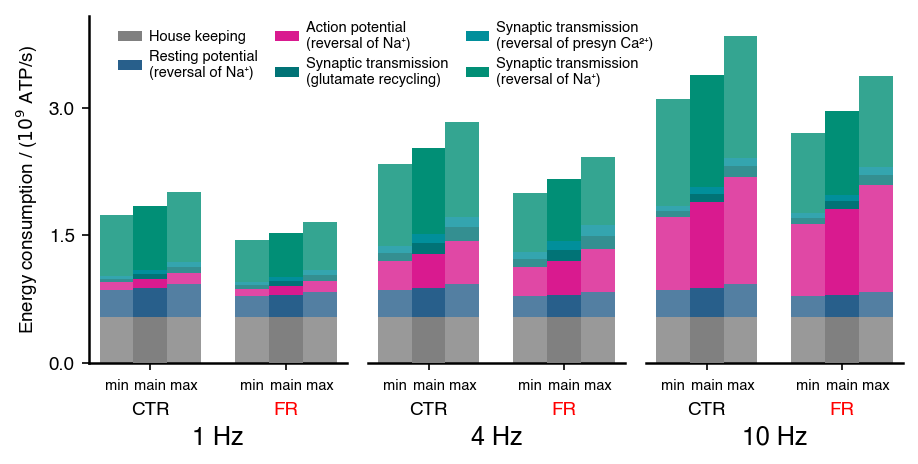

(<Figure size 1050x450 with 3 Axes>,
 array([<Axes: ylabel='Energy consumption / ($10^9$ ATP/s)'>, <Axes: >,
        <Axes: >], dtype=object))

In [76]:
# plotting Fig. S9 data
importlib.reload(ppf)
ppf.fig_energy_budget_minmax_bars(E_CTR, E_FR, E_CTR_minmax, E_FR_minmax, r_post_fit, r_post_values=[1.0, 4.0, 10.0], figsize=(7,3), savename_mode=True, fontsizes=fontsizes)


## Fig. S10

In [ ]:
# generate Fig. S10 data
# calculate the experimental membrane noise level
# path to .txt file
filename = '../Data/Padamsey_membrane_noise/example_traces_CTR_FR.txt'

# read all lines from the file
with open(filename, 'r') as f:
    lines = f.readlines()

# extract all bracketed series
series_list = []
for line in lines:
    match = re.search(r'\[(.*?)\]', line)
    if match:
        # parse the bracketed string into a python list
        data = ast.literal_eval(f"[{match.group(1)}]")
        series_list.append(data)

# determine the maximum length to pad shorter series
max_len = max(len(s) for s in series_list)
series_padded = [s + [np.nan] * (max_len - len(s)) for s in series_list]

# build a DataFrame with each series as its own column
df = pd.DataFrame({
    f'series_{i+1}': series_padded[i]
    for i in range(len(series_padded))})

V_m_CTR=np.asarray(series_list[0])
V_m_FR=np.asarray(series_list[1])

T=100 # maximum time
fs = 100000/T # sampling frequency

baseline_V_m_CTR, cleaned_V_m_CTR = af.clean_voltage_trace(signal=V_m_CTR,thresholds=[-70,-50],fs=fs, window=200, filter_quality=0.1, m=50)
baseline_V_m_FR , cleaned_V_m_FR = af.clean_voltage_trace(signal=V_m_FR,thresholds=[-90,-65],fs=fs, window=200, filter_quality=0.1, m=50)
baseline_signals = [baseline_V_m_CTR, baseline_V_m_FR]
cleaned_signals = [cleaned_V_m_CTR, cleaned_V_m_FR]

KS=kstest(cleaned_V_m_CTR[~np.isnan(cleaned_V_m_CTR)], cleaned_V_m_FR[~np.isnan(cleaned_V_m_FR)])

print('Control SD:', np.sqrt(np.nanvar(cleaned_V_m_CTR)))
print('Food restricted SD:', np.sqrt(np.nanvar(cleaned_V_m_FR)))
print('Kolmogorov-Smirnov p-value:', KS.pvalue)

# simulate membrane noise effect 
number_single_runs = 1000
model_mode = ['LIF', 'AdExp']
membrane_noise_vec = np.linspace(0,8,11)
synaptic_scaling_mode='multiplicative'

results_single_runs_membrane_noise_CTR_FR_LIF, results_single_runs_membrane_noise_CTR_FR_AdExp = sf.multiple_CTR_FR_membrane_noise_runs(number_single_runs, model_mode, membrane_noise_vec, synaptic_scaling_mode=synaptic_scaling_mode, savename='membrane_noise')


In [46]:
# loading Fig. S10 data

name_membrane_noise_CTR_FR = 'Padamsey_membrane_noise/20250825_membrane_noise_CTR_FR/20250825_cluster_results_single_runs_membrane_noise_CTR_FR_AdExp'
results_single_runs_membrane_noise_CTR_FR = af.load_data(name_membrane_noise_CTR_FR)
results_single_runs_membrane_noise_CTR = results_single_runs_membrane_noise_CTR_FR[0]
results_single_runs_membrane_noise_FR = results_single_runs_membrane_noise_CTR_FR[1]

with open("../Data/Padamsey_membrane_noise/experimental_membrane_noise.pkl", "rb") as f:
    experimental_membrane_noise_loaded = pickle.load(f)

baseline_signals, cleaned_signals, T, fs = (experimental_membrane_noise_loaded[k] for k in ('baseline_signals', 'cleaned_signals', 'T', 'fs'))

WARNING    /Users/psommer/Desktop/Energy-function-trade-off/Code/Functions/paper_energy_information_trade_off_plotting_functions.py:1695: UserWarning:

This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.

 [py.warnings]
1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp
Zapf NOT subset; don't know how to subset; dropped
feat NOT subset; don't know how to subset; dropped
morx NOT subset; don't know how to subset; dropped


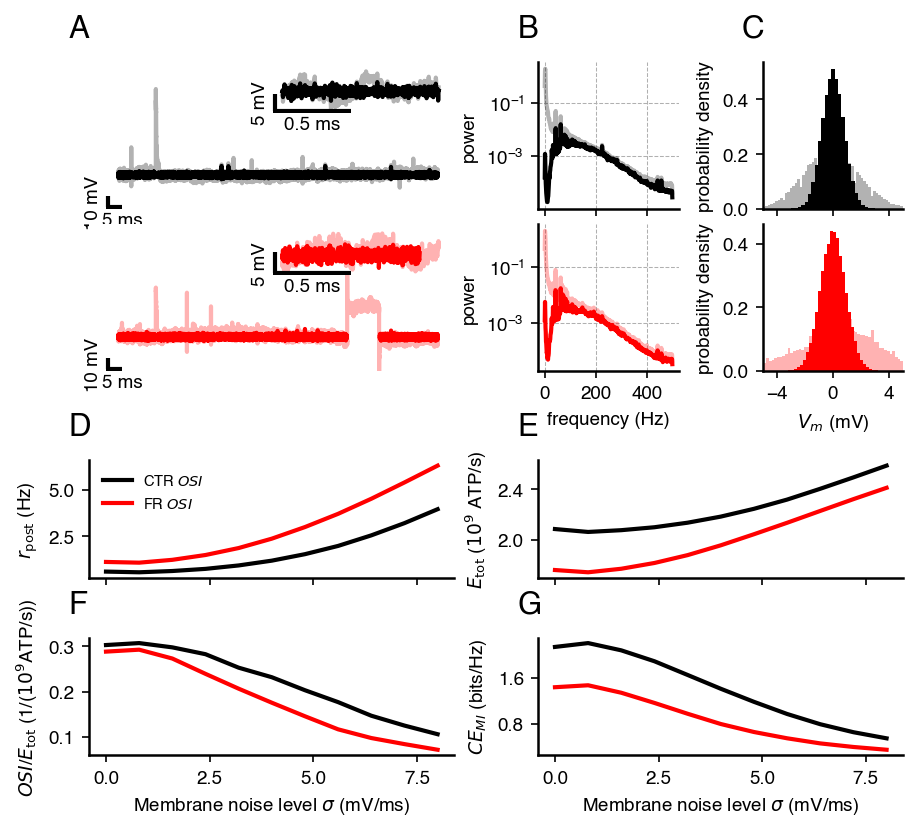

In [47]:
# plotting Fig. S10 data

ppf.fig_membrane_noise(baseline_signals, cleaned_signals, T, fs, results_single_runs_membrane_noise_CTR, results_single_runs_membrane_noise_FR, colors=[color_CTR, color_FR], fontsizes=fontsizes, figsize=(7,6), savename_mode=True)


## Fig. S11

In [ ]:
# generate Fig. S11 data

# generate V_gap_variable data
number_V_gap_runs = 1000
V_gaps = np.linspace(0, 6, 1) 
model_mode = ['LIF', 'AdExp']
membrane_noise=1.0
results_multiple_V_gap_variable_runs_LIF, results_multiple_V_gap_variable_runs_AdExp = sf.multiple_V_gap_variable_runs(number_V_gap_runs=number_V_gap_runs, V_gaps=V_gaps, model_mode=model_mode, membrane_noise=membrane_noise, savename='V_gap_variable')
# see python script: multiple_V_gap_variable_runs_cluster.py

# generate V_gap_constant data
number_V_gap_runs = 1000
V_rests = np.linspace(-80, -60, 18)
Delta_V_thresh = 22 #
model_mode = ['LIF', 'AdExp']
membrane_noise=1.0
results_multiple_runs_V_gap_LIF, results_multiple_runs_V_gap_AdExp = sf.multiple_V_gap_constant_runs(number_V_gap_runs=number_V_gap_runs, V_rests=V_rests, Delta_V_thresh=Delta_V_thresh, model_mode=model_mode, membrane_noise=membrane_noise, savename='V_gap_constant')
# see python script: multiple_V_gap_constant_runs_cluster.py

# generate data of synaptic reversal potential influence 
V_gaps = np.linspace(0, 6, 11) 
model_mode = ['LIF', 'AdExp']

results_single_run_E_L_LIF, results_single_run_V_thresh_LIF, results_single_run_E_L_AdExp, results_single_run_V_thresh_AdExp = sf.single_V_gap_variable_E_e_E_i_run(V_gaps, model_mode, membrane_noise=0.0)


In [50]:
# loading Fig. S11 data
# load V_gap constant data
name_V_gap_constant = 'Padamsey_V_gap_constant/20250904_V_gap_constant_membrane_noise/20250904_cluster_w_scale_85_membrane_noise_1_results_multiple_CTR_FR_V_gap_constant_runs_AdExp' 
results_multiple_CTR_FR_runs_V_gap_AdExp = af.load_data(name_V_gap_constant)

# load V_gap variable data
name_V_gap_variable = 'Padamsey_V_gap_variable/20250925_V_gap_variable/20250925_cluster_results_multiple_V_gap_variable_runs_AdExp'
results_V_gap_variable = af.load_data(name_V_gap_variable)
results_V_gap_variable_E_L = results_V_gap_variable[0]
results_V_gap_variable_V_thresh = results_V_gap_variable[1]

# load data of synaptic reversal potential influence 
name_V_gap_constant_E_e_E_i = '../Data/Padamsey_V_gap_constant/V_gap_E_e_E_i_Padamsey/E_e_E_i/E_e_E_i_results_single_run'
with open(f'{name_V_gap_constant_E_e_E_i}_V_thresh_AdExp.pkl', 'rb') as f:
    results_single_run_V_thresh_AdExp = pickle.load(f)

with open(f'{name_V_gap_constant_E_e_E_i}_E_L_AdExp.pkl', 'rb') as f:
    results_single_run_E_L_AdExp = pickle.load(f)

WARNING    /Users/psommer/Desktop/Energy-function-trade-off/Code/Functions/paper_energy_information_trade_off_plotting_functions.py:1762: UserWarning:

This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.

 [py.warnings]
1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp
Zapf NOT subset; don't know how to subset; dropped
feat NOT subset; don't know how to subset; dropped
morx NOT subset; don't know how to subset; dropped


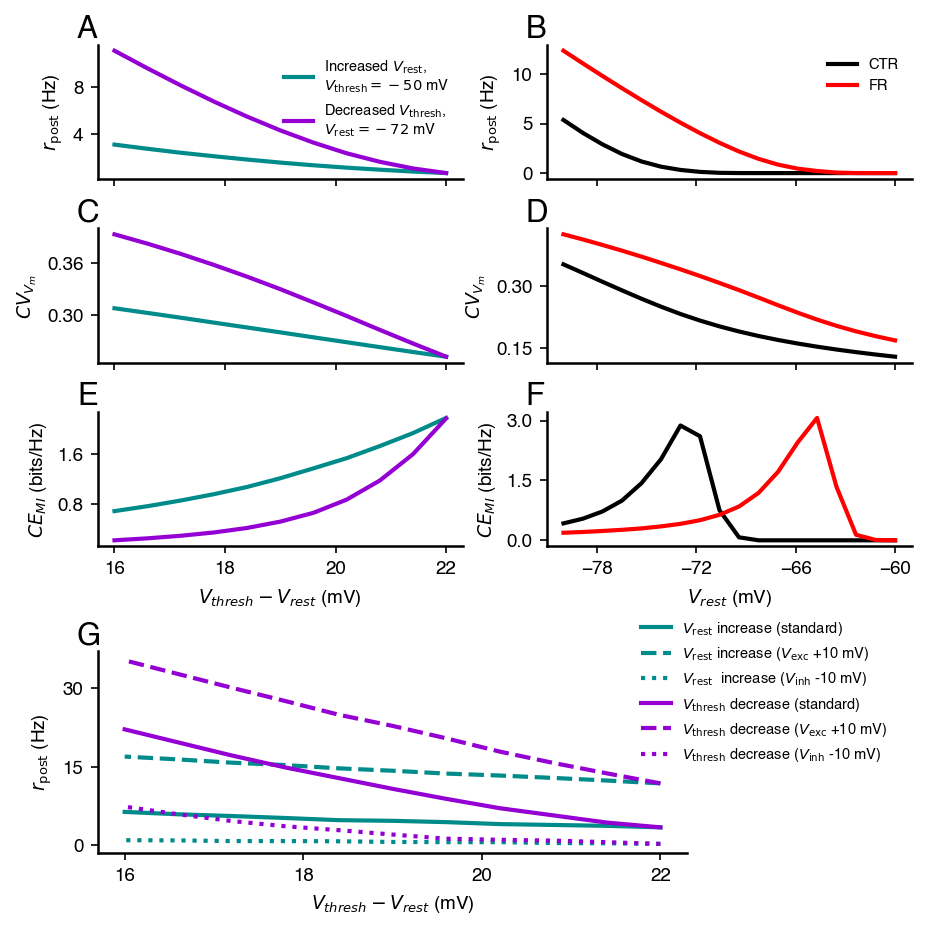

In [51]:
# plotting Fig. S11 data

ppf.fig_V_gap_additional(results_multiple_CTR_FR_runs_V_gap_AdExp, results_V_gap_variable_E_L, results_V_gap_variable_V_thresh, results_single_run_E_L_AdExp, results_single_run_V_thresh_AdExp, colors=[color_CTR, color_FR, color_V_rest_var, color_V_thresh_var], fontsizes=fontsizes, figsize=(7,7), savename_mode=True)


## Fig. S12

In [1]:
# generate Fig. S12 data
"""
# generate synaptic input 
neuron_type_mode = 'excitatory'

# define synaptic input
N_syn, N_e, N_e_signal_ratio, N_i, r_on, r_off, mu_rate_e, sigma_rate_e, mu_rate_i, sigma_rate_i, mu_weight_e, sigma_weight_e, mu_weight_i, sigma_weight_i = sif.synaptic_parameters_switching(neuron_type_mode=neuron_type_mode)
tau_switch = 1000 / (r_on + r_off) # in ms

# generate switching input
T = 10000 # ms
w_e_0, w_i_0, spike_times_e, spike_times_i, r_e, r_i, t_stim, N_e_signal, N_e_noise = sif.switching_input(N_e, N_i, N_e_signal_ratio, mu_rate_e, sigma_rate_e, mu_rate_i, sigma_rate_i, mu_weight_e, sigma_weight_e, mu_weight_i, sigma_weight_i, r_on, r_off, T)


# get signalling parts
w_e_signal = w_e_0[N_e_noise:]
r_e_signal = r_e[N_e_noise:]

# get rates of respective stimulus presentation (adapt ON-timepoint)
idx_t_OFF = np.where(np.isclose(t_stim, 0.0))[0][0]
idx_t_ON = np.where(np.isclose(t_stim, 1.0))[0][0]

r_e_signal_OFF = r_e_signal[:, idx_t_OFF]  
r_e_signal_ON = r_e_signal[:, idx_t_ON] 

tau_switch = 1000 / (r_on + r_off) # in ms
"""

"\n# generate synaptic input \nneuron_type_mode = 'excitatory'\n\n# define synaptic input\nN_syn, N_e, N_e_signal_ratio, N_i, r_on, r_off, mu_rate_e, sigma_rate_e, mu_rate_i, sigma_rate_i, mu_weight_e, sigma_weight_e, mu_weight_i, sigma_weight_i = sif.synaptic_parameters_switching(neuron_type_mode=neuron_type_mode)\ntau_switch = 1000 / (r_on + r_off) # in ms\n\n# generate switching input\nT = 10000 # ms\nw_e_0, w_i_0, spike_times_e, spike_times_i, r_e, r_i, t_stim, N_e_signal, N_e_noise = sif.switching_input(N_e, N_i, N_e_signal_ratio, mu_rate_e, sigma_rate_e, mu_rate_i, sigma_rate_i, mu_weight_e, sigma_weight_e, mu_weight_i, sigma_weight_i, r_on, r_off, T)\n\n\n# get signalling parts\nw_e_signal = w_e_0[N_e_noise:]\nr_e_signal = r_e[N_e_noise:]\n\n# get rates of respective stimulus presentation (adapt ON-timepoint)\nidx_t_OFF = np.where(np.isclose(t_stim, 0.0))[0][0]\nidx_t_ON = np.where(np.isclose(t_stim, 1.0))[0][0]\n\nr_e_signal_OFF = r_e_signal[:, idx_t_OFF]  \nr_e_signal_ON = r_e

In [55]:
# loading Fig. S12 data

with open("../Data/Zeldenrust_synaptic_input_data/synaptic_input_Zeldenrust.pkl", "rb") as f:
    synaptic_input_Zeldenrust = pickle.load(f)

t_stim, w_e_0, r_e, spike_times_e, spike_times_i, N_e_noise, T, tau_switch = (synaptic_input_Zeldenrust[k] for k in ("t_stim","w_e_0","r_e","spike_times_e","spike_times_i","N_e_noise","T","tau_switch"))


1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp
Zapf NOT subset; don't know how to subset; dropped
feat NOT subset; don't know how to subset; dropped
morx NOT subset; don't know how to subset; dropped


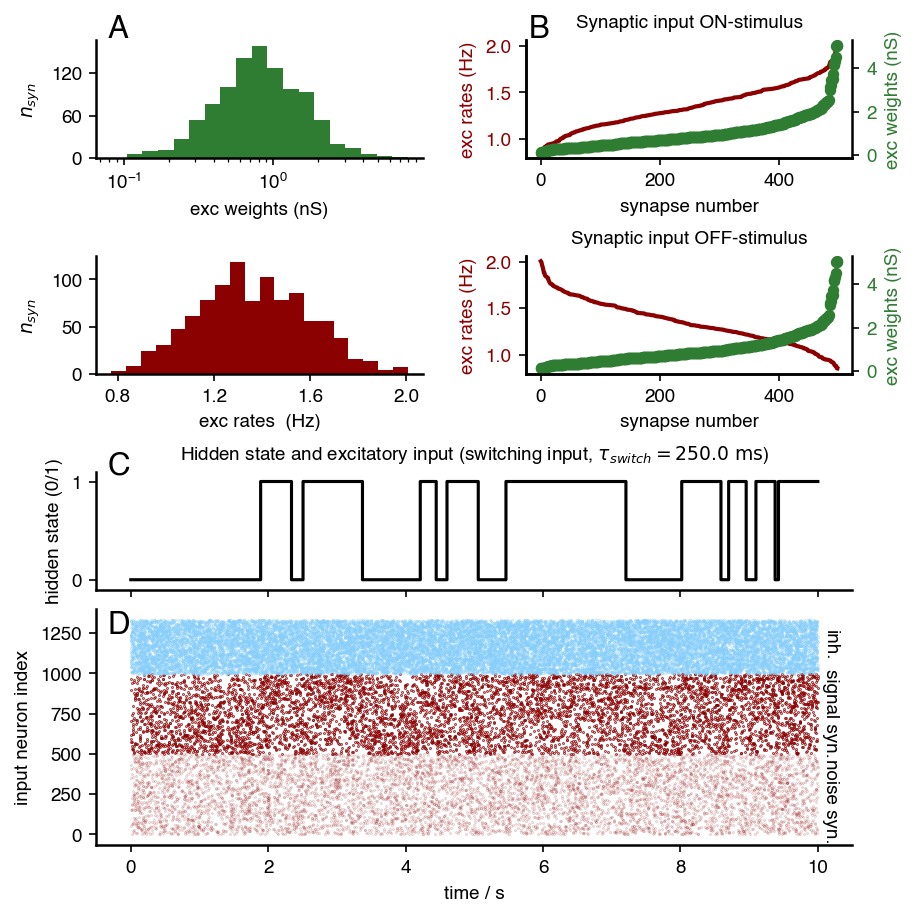

In [56]:
# plotting Fig. S12 data

ppf.fig_synaptic_input_Zeldenrust(t_stim, w_e_0, r_e, spike_times_e, spike_times_i, N_e_noise, T, tau_switch, colors=[color_w_e, color_r_e, color_input_exc, color_input_inh, color_CTR, color_FR], fontsizes=fontsizes, figsize=(6,6), savename_mode=True)


## Fig. S13

In [ ]:
# generate Fig. 13 data

#"""
file_name = 'asli_5-8-19_E7_analyzed'
data_folder = "../Data"
save_folder = "../Data_analyzed_PS"
dafZ.process_single_Zeldenrust_file(file_name, data_folder, save_folder, sim_mode='large')

with open(f"../Data_analyzed_PS/sequential_large/PS_EXC_{file_name}_large.pkl", "rb") as f:
    single_file_data = pickle.load(f)

data_exp = dafZ.load_experimental_data_for_SBI_entry(single_file_data, data_folder)
t_vec_exp, V_m_exp, I_inj_exp, I_syn_mean, spike_times_post_exp, hidden_state_exp, T_exp, firing_rate_exp, V_thresh_FZ, MI_FZ, FI_FZ, firing_rate_FZ_windowed, MI_FZ_windowed, FI_FZ_windowed, nup_windowed, ndown_windowed, nspikeperup_windowed, nspikeperdown_windowed = (data_exp[k] for k in ("t_vec_exp","V_m_exp","I_inj_exp","I_syn_mean","spike_times_post_exp","hidden_state_exp","T_exp","firing_rate_exp","membrane_threshold","MI_FZ_bits","FI_FZ","firing_rate_FZ_Hz_windowed","MI_FZ_bits_windowed","FI_FZ_windowed","nup_windowed","ndown_windowed","nspikeperup_windowed","nspikeperdown_windowed"))

R_m_est, E_L_est, R2 = dafZ.estimate_R_m_E_L_subthreshold(V_m_exp, I_inj_exp, V_thresh_FZ, plotting_mode=False)

dt_original = 0.1 # ms
T_window = 2000 # ms
early_return_rate = 15 # Hz

# estimate E_L
R_m_est, E_L_est, R2 = estimate_R_m_E_L_subthreshold(V_m_exp, I_inj_exp, V_thresh_FZ, plotting_mode=False)

# run SBI 
# prepare experimental data
V_m_exp_subthreshold = dafZ.subthreshold_voltage_trace(V_m_exp, V_thresh_FZ)

dt_original = dt
T_window = 2000 # ms
early_return_rate = 15 # Hz

t_vec_window, V_m_exp_subthreshold_window, I_inj_exp_window, spike_times_post_exp_window, spike_times_post_exp_window_zeroed, best_start_idx, end_idx = dafZ.extract_max_spikes_window(t_vec_exp, V_m_exp_subthreshold, I_inj_exp, spike_times_post_exp, dt_original=dt_original, T_window=T_window, early_return_rate=early_return_rate)

# run SBI
dt_target_V_m = 2.0 # ms
dt_target_spike_train = 125.0 # ms
pre_spike_time_window = 5.0 # ms
post_spike_time_window = 20.0 # ms
std_ms = 0.5 # ms
tau_ref = 5 # ms

param_names=[r"$V_{rest}$",r"$R_m$", r"$C_m$", r"$V_{thresh}$", r"$V_{reset}$", r"$Delta_T$", r"$\tau_{ad}$", r"$a_{ad}$", r"$b_{ad}$"]
param_units=["mV", "MOhm", "pF", "mV", "mV", "mV", "ms", "nS", "nA"]

# sequential SBI
num_simulations_s1=6000
num_simulations_s2=12000
savename_s1=None
savename_s2=None
use_cached_s1=False
use_cached_s2=False

means, stds, maps, samples = run_sbi_sequential(
    V_m_exp_subthreshold_window,
    I_inj_exp_window,
    spike_times_post_exp_window_zeroed,
    E_L_est,
    V_thresh_FZ,
    tau_ref, 
    t_vec_window,
    dt_original,
    dt_target_V_m, 
    dt_target_spike_train,
    pre_spike_time_window, 
    post_spike_time_window, 
    std_ms,
    T_window,
    num_simulations_s1,
    num_simulations_s2, savename_s1,
    savename_s2, use_cached_s1, use_cached_s2)

t_vecs, V_ms, spike_times_posts, r_posts = dafZ.pack_experimental_and_simulate_SBI_voltage_trace_sequential(V_m_exp_subthreshold_window, I_inj_exp_window, spike_times_post_exp_window_zeroed, E_L_est, V_thresh_FZ, tau_ref, means, T_window, t_vec_window, dt_original, dt_target_V_m, dt_target_spike_train)
t_vec_mean_sim, V_m_mean_sim, V_m_samples, spike_times_post_mean_sim, spike_times_post_samples = dafZ.simulate_V_m_SBI_posterior_samples(I_inj_exp_window, means, samples, E_L_est, V_thresh_FZ, tau_ref, n_samples=100)

data_SBI = single_file_data
means = dafZ.compute_means_vector_from_data(data_SBI)
samples = posterior_samples
#"""



In [58]:
# loading Fig. 13 data

with open("../Data/Zeldenrust_data_analysis/posterior_example_trace/posterior_example_dict.pkl", "rb") as f:
    posterior_example_dict = pickle.load(f)

means,stds,maps,samples,t_vecs,V_ms,spike_times_posts,r_posts,param_names,param_units,E_L_est,V_thresh,I_inj_exp_window,description,t_vec_mean_sim,V_m_mean_sim,V_m_samples,spike_times_post_mean_sim,spike_times_post_samples=posterior_example_dict['means'],posterior_example_dict['stds'],posterior_example_dict['maps'],posterior_example_dict['samples'],posterior_example_dict['t_vecs'],posterior_example_dict['V_ms'],posterior_example_dict['spike_times_posts'],posterior_example_dict['r_posts'],posterior_example_dict['param_names'],posterior_example_dict['param_units'],posterior_example_dict['E_L_est'],posterior_example_dict['V_thresh'],posterior_example_dict['I_inj_exp_window'],posterior_example_dict['description'],posterior_example_dict['t_vec_mean_sim'],posterior_example_dict['V_m_mean_sim'],posterior_example_dict['V_m_samples'],posterior_example_dict['spike_times_post_mean_sim'],posterior_example_dict['spike_times_post_samples']


1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp
Zapf NOT subset; don't know how to subset; dropped
feat NOT subset; don't know how to subset; dropped
morx NOT subset; don't know how to subset; dropped


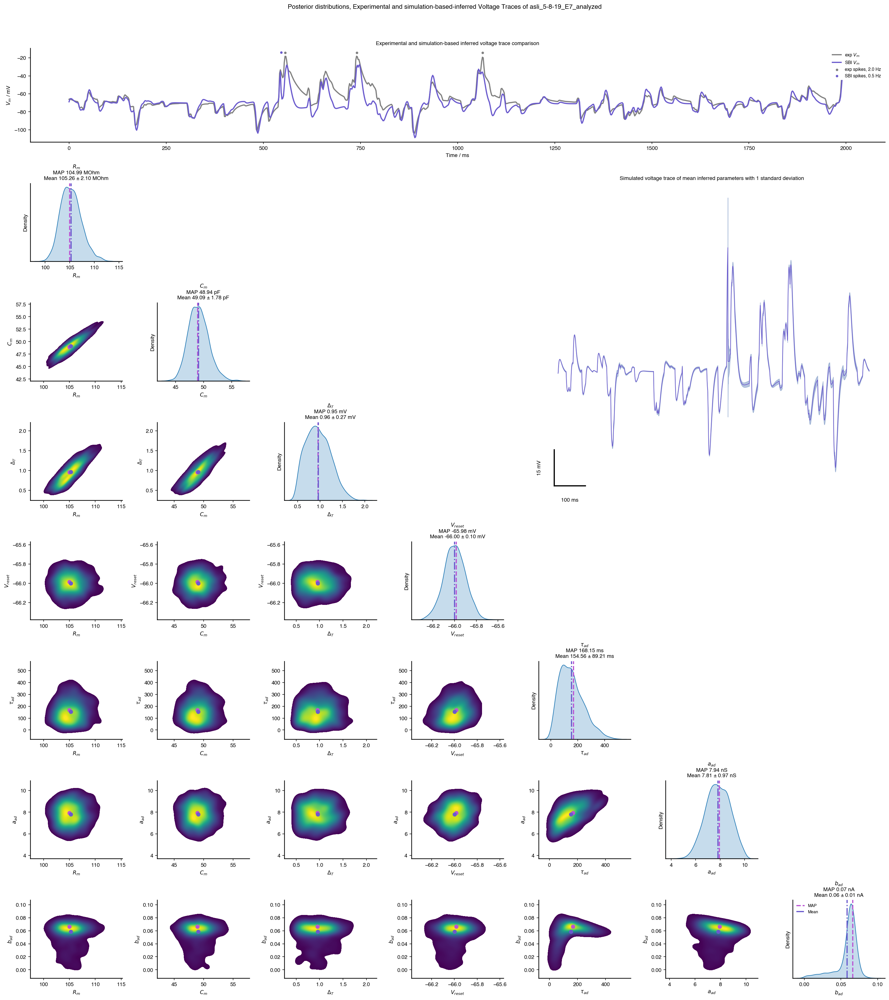

In [59]:
# plotting Fig. 13 data

ppf.fig_cornerplot_with_voltage_trace(means, stds, maps, samples, t_vecs, V_ms, spike_times_posts, r_posts, param_names, param_units=param_units, t_ms=t_vec_mean_sim, V_m_mean=V_m_mean_sim, V_m_samples=V_m_samples, description=description, savename_mode=True)
          

## Fig. S14

In [ ]:
# generate Fig. S14 data
"""
# python script: Zeldenrust_data_analysis_full
import os
import Data_analysis_Zeldenrust_functions as dafZ#

data_folder = "../Data"
save_folder = "../Data_analyzed_PS"

# iterate over all files in data_folder
for file_name in os.listdir(data_folder):
    if not file_name.endswith(".mat"):
        continue
    
    dafZ.process_single_Zeldenrust_file(file_name, data_folder, save_folder)

"""

In [63]:
# loading Fig. S14 data
#"""
with open('../Data/Zeldenrust_data_analysis/Zeldenrust_results_analysis_all.pkl', 'rb') as f: 
    results_analysis_all = pickle.load(f)
with open('../Data/Zeldenrust_data_analysis/Zeldenrust_results_analysis_exc.pkl', 'rb') as f: 
    results_analysis_exc = pickle.load(f)
with open('../Data/Zeldenrust_data_analysis/Zeldenrust_results_analysis_inh.pkl', 'rb') as f: 
    results_analysis_inh = pickle.load(f)
#"""

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp
Zapf NOT subset; don't know how to subset; dropped
feat NOT subset; don't know how to subset; dropped
morx NOT subset; don't know how to subset; dropped


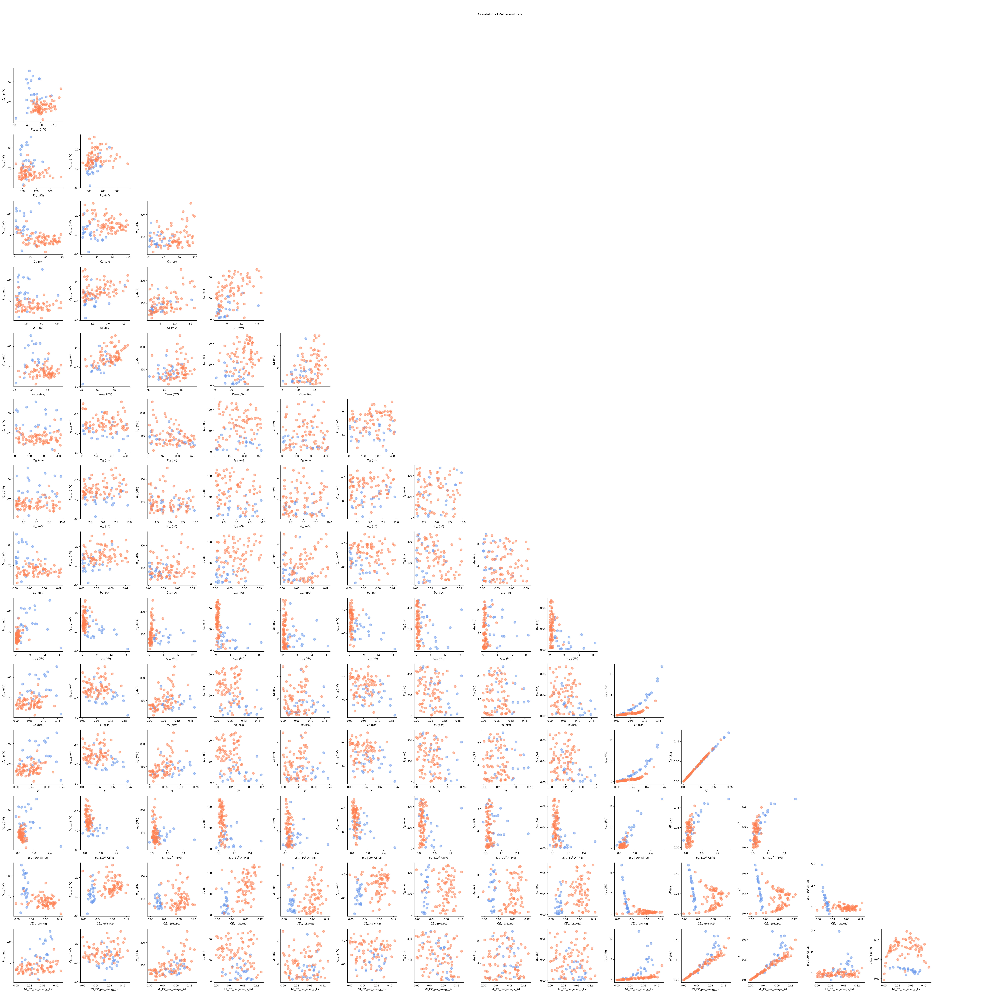

In [64]:
# plotting Fig. S14 data

features_list = ['E_L_mV_list', 'V_thresh_mV_list', 'R_m_mean_MOhm_list', 'C_m_mean_pF_list', 'Delta_T_mean_mV_list', 'V_reset_mean_mV_list', 'tau_w_mean_ms_list', 'a_w_mean_nS_list', 'b_w_mean_nA_list', 'firing_rate_Hz_list', 'MI_FZ_bits_list', 'FI_FZ_list', 'E_tot_1e9_ATP_per_s_list', 'MICE_FZ_list', 'MI_FZ_per_energy_list']
ppf.fig_cornerplot_correlations_Zeldenrust(results_analysis_exc, results_analysis_inh, features_list, description='Correlation of Zeldenrust data', colors=[color_exc, color_inh], savename_mode=True)


## Fig. S15

In [66]:
# loading Fig. S15 data
#"""
with open('../Data/Zeldenrust_data_analysis/Zeldenrust_results_analysis_all.pkl', 'rb') as f: 
    results_analysis_all = pickle.load(f)
with open('../Data/Zeldenrust_data_analysis/Zeldenrust_results_analysis_exc.pkl', 'rb') as f: 
    results_analysis_exc = pickle.load(f)
with open('../Data/Zeldenrust_data_analysis/Zeldenrust_results_analysis_inh.pkl', 'rb') as f: 
    results_analysis_inh = pickle.load(f)
#"""

In [67]:
# generate Fig. S15 data
features_list = ['E_L_mV_list', 'V_thresh_mV_list', 'R_m_mean_MOhm_list', 'C_m_mean_pF_list', 'Delta_T_mean_mV_list', 'V_reset_mean_mV_list', 'tau_w_mean_ms_list', 'a_w_mean_nS_list', 'b_w_mean_nA_list']

pca_all, scores_all, cell_types_list_all, X_full_scaled_all, scaler_all = dafZ.run_pca_analyzed_data_Zeldenrust(results_analysis_exc, results_analysis_inh, features_list, n_components=3)

empty_dic = {'name_list': [],  'E_L_mV_list': [], 'V_thresh_mV_list': [], 'R_m_mean_MOhm_list': [], 'C_m_mean_pF_list': [], 'Delta_T_mean_mV_list': [], 'V_reset_mean_mV_list': [], 'tau_w_mean_ms_list': [], 'a_w_mean_nS_list': [], 'b_w_mean_nA_list': []}
pca_exc, scores_exc, cell_types_list_exc, X_full_scaled_exc, scaler_exc = dafZ.run_pca_analyzed_data_Zeldenrust(results_analysis_exc, empty_dic, features_list, n_components=3)
pca_inh, scores_inh, cell_types_list_inh, X_full_scaled_inh, scaler_inh = dafZ.run_pca_analyzed_data_Zeldenrust(empty_dic, results_analysis_inh, features_list, n_components=3)


WARNING    /Users/psommer/Desktop/Energy-function-trade-off/Code/Functions/paper_energy_information_trade_off_plotting_functions.py:2040: UserWarning:

This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.

 [py.warnings]
1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp
Zapf NOT subset; don't know how to subset; dropped
feat NOT subset; don't know how to subset; dropped
morx NOT subset; don't know how to subset; dropped


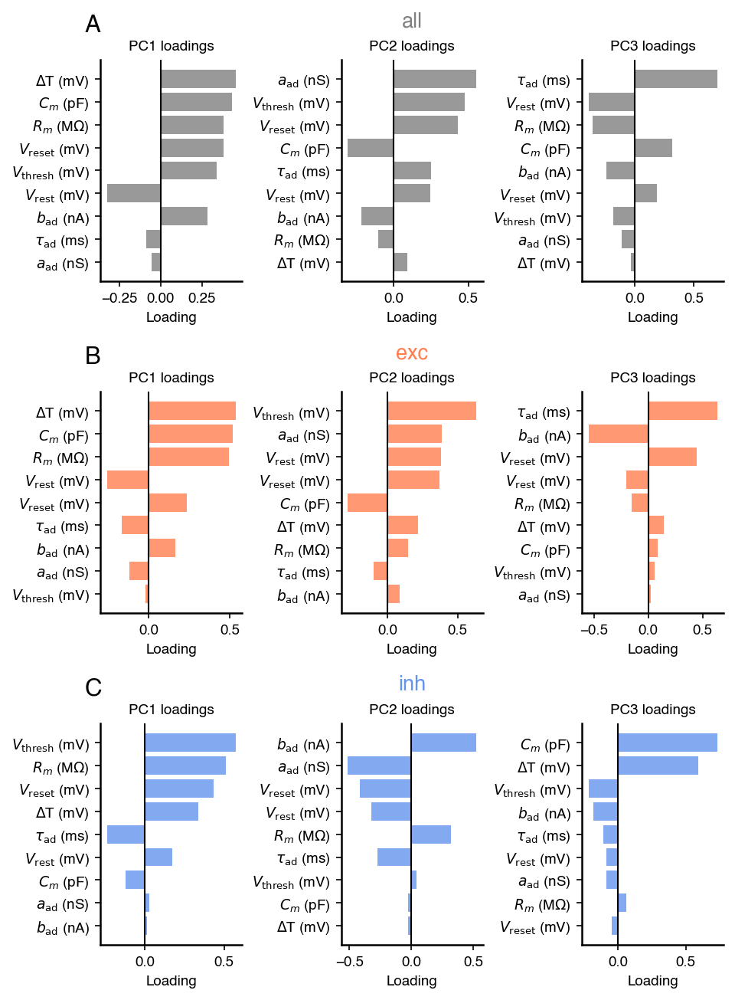

(<Figure size 1050x1500 with 9 Axes>,
 [[<Axes: title={'center': 'PC1 loadings'}, xlabel='Loading'>,
   <Axes: title={'center': 'PC2 loadings'}, xlabel='Loading'>,
   <Axes: title={'center': 'PC3 loadings'}, xlabel='Loading'>],
  [<Axes: title={'center': 'PC1 loadings'}, xlabel='Loading'>,
   <Axes: title={'center': 'PC2 loadings'}, xlabel='Loading'>,
   <Axes: title={'center': 'PC3 loadings'}, xlabel='Loading'>],
  [<Axes: title={'center': 'PC1 loadings'}, xlabel='Loading'>,
   <Axes: title={'center': 'PC2 loadings'}, xlabel='Loading'>,
   <Axes: title={'center': 'PC3 loadings'}, xlabel='Loading'>]])

In [68]:
# plot Fig. S15 data

ppf.fig_3x3_pc_loadings_bars(pca_all, pca_exc, pca_inh, features_list, colors=['grey', color_exc, color_inh], description=False, figsize=(7,10), fontsizes=fontsizes, savename_mode=True)



## Graphical abstract

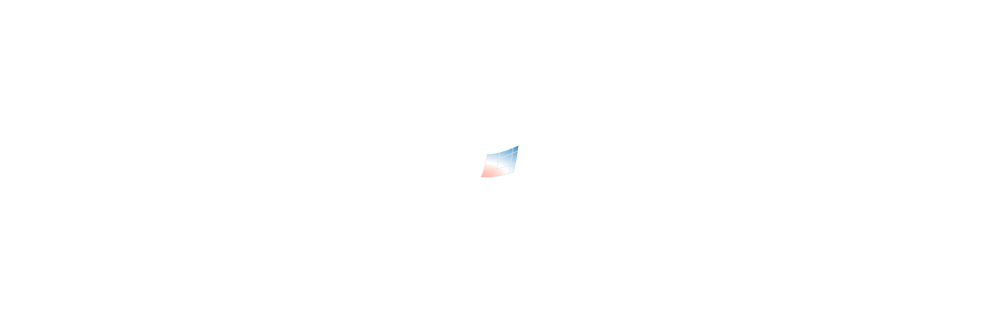

In [29]:
import numpy as np
import plotly.graph_objects as go

n = 80
Rm = np.linspace(0.0, 1.2, n)   # R_m >= 0
we = np.linspace(0.0, 1.2, n)   # w_e >= 0
X, Y = np.meshgrid(Rm, we)

# bowl-like surface, minimum at (0,0,0)
Z = X**2 + 1.3 * Y**2 + 0.4 * X * Y

gridline_rgba = "rgba(0,0,0,0.10)"  # ~12% gray/black (subtle)

fig = go.Figure(
    data=go.Surface(
        x=X, y=Y, z=Z,
        showscale=False,
        colorscale=[
            [0.00, "#f6b1a0"],  # red (bottom)
            [0.25, "#f7f7f7"],  # near white
            [1.00, "#2b83ba"],  # blue (top)
        ],
        lighting=dict(ambient=0.75, diffuse=0.6, specular=0.1, roughness=0.9), 
        contours=dict(x=dict(show=True, color=gridline_rgba, width=1, highlight=False), y=dict(show=True, color=gridline_rgba, width=1, highlight=False))))


axis_style = dict(showbackground=False, showgrid=False, zeroline=False, ticks="", showticklabels=False, showline=True, linecolor="white", linewidth=5, titlefont=dict(size=18, color="black"))

camera_eye = dict(x=1.3, y=-1.6, z=0.9)

# without axes
fig.update_layout(
    scene=dict(
        xaxis=dict(visible=False), yaxis=dict(visible=False), zaxis=dict(visible=False), aspectmode="manual", aspectratio=dict(x=1, y=1, z=0.7),
        camera=dict(eye=camera_eye_rot)), margin=dict(l=0, r=0, t=0, b=0), paper_bgcolor="rgba(0,0,0,0)", plot_bgcolor="rgba(0,0,0,0)")

# vector-friendly export
fig.show()
fig.write_image(
    "graphical_abstract_surface.png",
    format="png",
    scale=4,                  # increase for higher resolution
    width=1200,
    height=900,
    engine="kaleido")